
#  Identification and characterization of functional guilds performing cryptic organotrophic and lithotrophic electron recycling within anaerobic granules

## Samuel J. Bryson

#### Analysis of metagenomes derived from three individual granular biofilms that posessed a layered structure (*like an onion*) consisting of a dark core and alternating light and dark layers. 

<img src="./img/anaerobic_granule.jpg" width=400 height=400 />

### Granule features:

- Originally obtained from an anaerobic digestor treating dairy processing wastewater.
- Maintained under anoxic conditions in a lab scale fluidized bed reator with no carbon source supplied in the media, but nitrate and sulfate were supplied in the influent media.
- Charaterization of the granules included edx(???) analysis that revealed the presence of iron sulfur (FeS) and pyrite (FeS<sub>2</sub>) and short term incubations (*i.e. batch tests*) that examined hydrolysis of organic carbon (*acetate production*), methanogenesis (CH<sub>4</sub> production) plus nitrate (NO<sub>3</sub><sup>-</sup>) and sulfate (SO<sub>4</sub><sup>2-</sup>) reduction.
 
### This Jupyter Notebook presents bioinformatics analysis performed in order to:

**Characterize the microbial community structure.**

- Who's there? What's their relative abundance?
 
**Identify functional guilds within the assemblage.**

- Which taxa perform what ecological functions?
- Can individual taxa be grouped together into clusters that perform similar functions?

**Compare the identified taxa and their associated functions across different environments.**

- Are individual taxa (*metagenome assembled genomes or MAGs*) found in other similar or different environments, e.g. other anaerobic digesters, cattle rumens, wetland soil, or groundwater?
- What does detecion accross different environments rebeal about environmental filtering and the selective pressures imposed on different funtional genes?


### Metagenome  assembly, bining, and annotation

#### Metagenome sequencing
- DNA extration
- Illumina sequencing
- MinION sequencing


#### Sequence processing using Kbase

Arkin, Adam P., Robert W. Cottingham, Christopher S. Henry, Nomi L. Harris, Rick L. Stevens, Sergei Maslov, Paramvir Dehal, et al. 2018. “KBase: The United States Department of Energy Systems Biology Knowledgebase.” Nature Biotechnology 36 (7): 566–69.

1. Library QC
    - Trimmomatic
        - Bolger, Anthony M., Marc Lohse, and Bjoern Usadel. 2014. “Trimmomatic: A Flexible Trimmer for Illumina Sequence Data.” Bioinformatics  30 (15): 2114–20.

2. Assembly
    - HybridSPAdes
        - Antipov, Dmitry, Anton Korobeynikov, Jeffrey S. McLean, and Pavel A. Pevzner. 2016. “hybridSPAdes: An Algorithm for Hybrid Assembly of Short and Long Reads.” Bioinformatics  32 (7): 1009–15.

3. Binning
    - MaxBIN2
        - Wu, Yu-Wei, Blake A. Simmons, and Steven W. Singer. 2016. “MaxBin 2.0: An Automated Binning Algorithm to Recover Genomes from Multiple Metagenomic Datasets.” Bioinformatics  32 (4): 605–7.
    - CheckM
        - Parks, Donovan H., Michael Imelfort, Connor T. Skennerton, Philip Hugenholtz, and Gene W. Tyson. 2015. “CheckM: Assessing the Quality of Microbial Genomes Recovered from Isolates, Single Cells, and Metagenomes.” Genome Research 25 (7): 1043–55.

#### Local sequence analysis

4. Annotation
    - Prodigal (ORF calling)
        - Hyatt, Doug, Gwo-Liang Chen, Philip F. Locascio, Miriam L. Land, Frank W. Larimer, and Loren J. Hauser. 2010. “Prodigal: Prokaryotic Gene Recognition and Translation Initiation Site Identification.” BMC Bioinformatics 11 (March): 119.
    - eggNOG
        - Huerta-Cepas, Jaime, Kristoffer Forslund, Luis Pedro Coelho, Damian Szklarczyk, Lars Juhl Jensen, Christian von Mering, and Peer Bork. 2017. “Fast Genome-Wide Functional Annotation through Orthology Assignment by eggNOG-Mapper.” Molecular Biology and Evolution 34 (8): 2115–22.
        - Huerta-Cepas, Jaime, Damian Szklarczyk, Davide Heller, Ana Hernández-Plaza, Sofia K. Forslund, Helen Cook, Daniel R. Mende, et al. 2019. “eggNOG 5.0: A Hierarchical, Functionally and Phylogenetically Annotated Orthology Resource Based on 5090 Organisms and 2502 Viruses.” Nucleic Acids Research 47 (D1): D309–14.
    - Kegg (https://www.genome.jp/kaas-bin/kaas_main?prog=GHOSTX&way=s)
    - CAZyme
        - Cantarel, Brandi L., Pedro M. Coutinho, Corinne Rancurel, Thomas Bernard, Vincent Lombard, and Bernard Henrissat. 2009. “The Carbohydrate-Active EnZymes Database (CAZy): An Expert Resource for Glycogenomics.” Nucleic Acids Research 37 (Database issue): D233–38.
        - Huang, Le, Han Zhang, Peizhi Wu, Sarah Entwistle, Xueqiong Li, Tanner Yohe, Haidong Yi, Zhenglu Yang, and Yanbin Yin. 2018. “dbCAN-Seq: A Database of Carbohydrate-Active Enzyme (CAZyme) Sequence and Annotation.” Nucleic Acids Research 46 (D1): D516–21.
    - GTDA-Tk
        - Chaumeil, Pierre-Alain, Aaron J. Mussig, Philip Hugenholtz, and Donovan H. Parks. 2019. “GTDB-Tk: A Toolkit to Classify Genomes with the Genome Taxonomy Database.” Bioinformatics , November. https://doi.org/10.1093/bioinformatics/btz848.
        
5. Read alignment
    - Bowtie2
        - Langmead, Ben, and Steven L. Salzberg. 2012. “Fast Gapped-Read Alignment with Bowtie 2.” Nature Methods 9 (4): 357–59.
    - SAMtools
        - Danecek, Petr, James K. Bonfield, Jennifer Liddle, John Marshall, Valeriu Ohan, Martin O. Pollard, Andrew Whitwham, et al. 2021. “Twelve Years of SAMtools and BCFtools.” GigaScience 10 (2). https://doi.org/10.1093/gigascience/giab008.

### Annotation

**annotate bin taxonomy with GTDB-TK**

    gtdbtk classify_wf --genome_dir ./data/bins --out_dir ./data/gtdb-tk --cpus 16 --scratch_dir ./temp -x fasta
    
**call ORFs with Prodigal**
    
    prodigal -i ./data/assembly_maxbin.fasta -a ./data/assembly_maxbin_prodigal.faa -d ./data/assembly_maxbin_prodigal.fna -f gff -o ./data/assembly_maxbin_prodigal.gff -p meta -m

**annotate ORFs with eggnog_mapper.py**

    emapper.py --usemem --cpu 12 --output_dir ./data -i ./data/assembly_maxbin_prodigal.faa -o ./data/assembly_maxbin_prodigal.faa.emapper_dmnd -m diamond

**CAZYme annotations**
  
    hmmscan --cpu 16 --tblout ./data/assembly_maxbin_prodigal.cazy.hmmscan.txt --domtblout ./data/assembly_maxbin_prodigal.cazy.hmmscan.domtblout --notextw -E 1e-15 /home/CAZy/run_dbcan/db/dbCAN-HMMdb-V8 ./data/assembly_maxbin_prodigal.clean.faa

    diamond blastp --threads 12 --db /home/CAZy/run_dbcan/db/CAZy.dmnd --out ./data/assembly_maxbin_prodigal_cazy.dmnd.txt --outfmt 6 --evalue 1e-121 --query ./data/assembly_maxbin_prodigal.clean.faa

### Read alignment

**Bowtie2 read mapping to sam, sam to bam, bam to mpileup**

These metagenome samples
    
    bowtie2 -x ./data/assembly_bt2_db -1 ./data/ABC_R1.fastq.gz -2 ./data/ABC_R2.fastq.gz --no-unal --no-head --no-sq -p 12 -S ABC.sam
    
Downloaded short read archives (SRA)
 
*For read mapping (calculating RPKM stats):*
 
    bowtie2 --very-fast-local -x ./data/assembly_bt2_db -U SRA###.fastq --no-unal --no-head --no-sq -p 12 -S SRA###.lcl.sam
    
*For mpileup (calculating position specific genome coverage):*
 
 
  bowtie2 --very-fast-local -x ./data/assembly_bt2_db -U SRA###.fastq --no-unal -p 12 | samtools view -bS | samtools sort -@ 12 -o SRA###.lcl.sorted.bam

    for f in ${fastq_list[@]}; do
    
    bowtie2 --very-fast-local -x ./data/assembly_bt2_db -U ${f}.fastq --no-unal -p 12 | samtools view -bS | samtools sort -@ 12 -o ${f}.lcl.sorted.bam
    
    done
    
  samtools mpileup --count-orphans --reference ./data/assembly.fasta --output SRA###.lcl.sorted.mpileup  SRA###.lcl.sorted.bam
    
    
    for f in ${fastq_list[@]}; do
    
    echo -e "\n#_"${f}
    
    samtools mpileup --count-orphans --reference ./data/assembly.fasta --output ${f}.lcl.sorted.mpileup ${f}.lcl.sorted.bam
    
    done
    
    
    



## Import some libraries

In [1]:
%matplotlib inline
import io
import operator
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import show
import matplotlib.gridspec as gridspec
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import numpy as np
import scipy.stats as stats
import scipy.spatial.distance
import scipy.cluster.hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from ipywidgets import FloatProgress
from IPython.display import display



# Load Metagenome assembly (bins and annotations) into a data structure that facilitates summarizing data at taxonomic, functional, and coverage depth from read mapping

#### Dictionary with hierarchy


 1. Bins -> Scaffolds/Contigs -> Index/Position
 
    - Gene -> {length, annotation, ...potentially add additional data like amino acid sequence}
    - Coverage -> data from read mapping [coverage A, coverage B, ... coverage X]
    - Potential to add in information about variant calling -> peptide graph structure?
     
     
     
 2. GFF file from a gene calling program (e.g. Prodigal)
 
    - Adds identifiers and indexes for ORF calls
     
     
 3. Sequence alignment map (SAM) files
 
    - Read mapping data from sequence libraries for calculation of RPKM
    - Pileup data for gene position coverage information
 
 
 3. Functionality for ploting data
 
    - Bar charts for taxonomic and functional distributions
    - Dendrogram from clustering
    - ...
 
 
 4. Functions for statistical tests
 
    - Transformation of functional gene counts for clustering and enrichment tests
     
     
     

In [3]:
class MetagenomeAssembly():
    def __init__(self, assembly_name,
                 binned_assembly_fasta='',
                 gff_file='',
                 checkM_summary_file='',
                 taxonomy_annotation_file='',
                 kegg_annotations_file='',
                 cazy_annotations_file='',
                 cog_annotations_file=''):
        self.name = assembly_name
        self.assembly_dict = {}
        self.assembly_stats_dict = {}
        self.node_count = 0 #_total number of scaffolds/contigs/nodes from assembly
        self.total_length = 0 #_total length of the assembly
        self.lengths_list = [] #_list of all scaffold/contig/node lengths from assembly
        self.bin_count = 0 #_number of bins in the binned assembly
        #_Use sam files for read based stats (e.g. RPKM)
        self.sam_files_list = [] #_list of sam files for read mapping based analyses
        self.sam_files_names = [] #_list of simple names for sam files
        self.sam_files_mapped_counts = [] #_list of total mapped read counts from each sam file
        #_Use mpileup files for per base stats
        self.mpileup_files_list = [] #_list of mpileup files
        self.mpileup_files_names = [] #_list of base names for mpileup files - could be same as sam files
        self.mpileup_sums = []
        self.keggID_list = []
        #_Run methods to load data
            #__binned_assembly_fasta required
            #__gff file required
            #__other annotation files optional
        if binned_assembly_fasta:
            self.load_binned_assembly(binned_assembly_fasta, num=1)
        if gff_file:
            self.load_gff_file(gff_file, num=2)
        if checkM_summary_file:
            self.load_checkM_summary(checkM_summary_file, num=3)
        if taxonomy_annotation_file:
            self.load_bin_taxonomy(taxonomy_annotation_file, num=4)
        if kegg_annotations_file:
            self.load_kegg_annotations(kegg_annotations_file, num=5)
        if cazy_annotations_file:
            self.load_CAZy_annotations(cazy_annotations_file, num=6)
        if cog_annotations_file:
            self.load_COG_category_annotations(cog_annotations_file, num=7)
        
    #------------------------------------------------------------------#
    # Methods for loading and summarizing the binned assembly
    #------------------------------------------------------------------#      

    def load_binned_assembly (self, binned_assembly_fasta, num=' '):
        #_This function imports the fasta file of the complete metagenome assembly
        ##__This needs to be a single fasta file with headers that have been modified
        ##___to look like this: ">unique_binID|unique_contig_or_scaffoldID"  
        print(f"\n\t<{num}> Loading binned assembly fasta:\n\t\t{binned_assembly_fasta}")
        self.node_count = 0
        self.bin_count = 0
        self.total_length = 0
        self.lengths_list = []
        seq = ''
        seq_length = 0
        with open(binned_assembly_fasta) as inF:
            for line in inF:
                line = line.strip()
                if line[0] == '>':
                    self.node_count += 1
                    if seq:
                        seq_length = len(seq)
                        self.total_length += seq_length
                        self.lengths_list.append(seq_length)
                        #_check if binID already in dict
                        if binID not in self.assembly_dict:  
                            self.bin_count += 1
                            self.assembly_dict[binID] = {'completeness':0.0,
                                                         'contamination':0.0,
                                                         'nodes':[],
                                                         'lengths':[],
                                                         'bin_length':0,
                                                         'mapped_counts':[],
                                                         'rpkm':[],
                                                         'taxonomy':{},
                                                         'genes':{}}
                        #_insert the sequence data
                        self.assembly_dict[binID]['nodes'].append(nodeID)
                        self.assembly_dict[binID]['lengths'].append(seq_length)
                        self.assembly_dict[binID]['bin_length'] += seq_length
                        seq = ''
                        seq_length = 0     
                    line = line[1:]
                    headerList = line.split('|')
                    binID = headerList[0]
                    nodeID = headerList[1]   
                else:
                    seq += line  
        if seq:
            seq_length = len(seq)
            self.total_length += seq_length
            self.lengths_list.append(seq_length)
            #_check if binID already in dict
            if binID not in self.assembly_dict:  
                self.bin_count += 1
                self.assembly_dict[binID] = {'completeness':0.0,
                                            'contamination':0.0,
                                            'nodes':[], \
                                            'lengths':[], \
                                            'bin_length':0, \
                                            'mapped_counts':[], \
                                            'rpkm':[], \
                                            'genes':{},
                                            'taxonomy':{'domain':'',
                                                       'phylum':'',
                                                       'class':'',
                                                       'order':'',
                                                       'family':'',
                                                       'genus':''}}
            
            #_insert the sequence data
            self.assembly_dict[binID]['nodes'].append(nodeID)
            self.assembly_dict[binID]['lengths'].append(seq_length)
            self.assembly_dict[binID]['bin_length'] += seq_length
            seq = ''
            seq_length = 0   
        inF.close()
        #_print some info about the binned assembly
        print(f"\t - Total bins (includes 1 unbinned bin): {self.bin_count}")
        print(f"\t - Total nodes: {self.node_count}")
        print(f"\t - Total length: {self.total_length}")
        
        
    def get_assembly_stats (self):
        self.lengths_list = np.asarray(self.lengths_list)
        self.assembly_stats_dict['Number scaffolds'] = self.lengths_list.size
        self.assembly_stats_dict['Assembly length'] = np.sum(self.lengths_list)
        self.assembly_stats_dict['Average'] = np.mean(self.lengths_list)
        self.assembly_stats_dict['Median'] = np.median(self.lengths_list)
        self.assembly_stats_dict['Longest'] = np.amax(self.lengths_list)
        self.assembly_stats_dict['Shortest'] = np.amin(self.lengths_list)
        half = self.assembly_stats_dict['Assembly length']/2.0
        self.sorted_lengths_list = np.sort(self.lengths_list)
        cumulative_sum = 0
        for i in self.sorted_lengths_list:
            cumulative_sum += i
            if cumulative_sum >= half:
                self.assembly_stats_dict['N50'] = i
                break
        assembly_stats = ['Number scaffolds','Assembly length','Average','Median',
                          'Longest','Shortest','N50']
        assembly_stat_vals = [self.assembly_stats_dict[x] for x in assembly_stats]
        assembly_stats_df = pd.DataFrame(list(zip(assembly_stats,assembly_stat_vals)))
        assembly_stats_df.columns = ['Assembly stats','value(bp)']
        pd.options.display.float_format = '{:,.0f}'.format
        display(assembly_stats_df)
        pd.reset_option('^display.', silent=True)

    #------------------------------------------------------------------#
    # Method to load gene calls from gff file
    #------------------------------------------------------------------#
    
    def load_gff_file (self, gff_file, num=' '):  
        #_Load gff file with positional information for each predicted CDS
        #_self.asse
        #_Put data into the self.assembly_dict[binID]['genes'] dictionary
        print(f"\n\t<{num}> Loading gff file:\n\t\t{gff_file}")
        self.node_gff = {}
        geneID_count = 0
        with open(gff_file) as inF:
            for line in inF:
                if line[0] != '#':
                    lineList = line.strip().split('\t')
                    binID = lineList[0].split('|')[0]
                    #nodeID = lineList[0].split('|')[1]
                    nodeID = lineList[0]
                    gene_start = int(lineList[3])
                    gene_stop = int(lineList[4])
                    #geneID = lineList[0] + '_' + lineList[8].split(';')[0].split('_')[1]
                    orf_info = lineList[8].split(';')
                    orf_number = orf_info[0].split('_')[1]
                    geneID = lineList[0] + '_' + orf_number
                    geneID_count += 1
                    if nodeID not in self.node_gff:
                        self.node_gff[nodeID] = {'starts':[gene_start],
                                                'stops':[gene_stop],
                                                'geneID':[geneID]}
                    else:
                        self.node_gff[nodeID]['starts'].append(gene_start)
                        self.node_gff[nodeID]['stops'].append(gene_stop)
                        self.node_gff[nodeID]['geneID'].append(geneID)
                    gene_length = gene_stop - gene_start + 1
                    if geneID not in self.assembly_dict[binID]['genes']:
                        self.assembly_dict[binID]['genes'][geneID] = {}
                        
                    self.assembly_dict[binID]['genes'][geneID]['length_nt'] = gene_length
                    self.assembly_dict[binID]['genes'][geneID]['COG'] = []
                    self.assembly_dict[binID]['genes'][geneID]['kegg'] = 'na'
                    self.assembly_dict[binID]['genes'][geneID]['CAZy_category'] = 'na'
                    self.assembly_dict[binID]['genes'][geneID]['CAZyme'] = 'na'
                    self.assembly_dict[binID]['genes'][geneID]['mpileup']= []
        inF.close()
        print(f"\t - Total ORFs: {geneID_count}")
    
    #------------------------------------------------------------------#
    # Method to load CheckM bin completeness and contamination stats
    #------------------------------------------------------------------#
    
    def load_checkM_summary (self, checkM_summary_file, num=' '):  
        #_Read output file with checkM_summary for each bin
        #_Put data into self.assembly_dict[binID]['completeness']
        #_____and self.assembly_dict[binID]['contamination']
        print(f"\n\t<{num}> Loading CheckM summary:\n\t\t{checkM_summary_file}")
        bin_count = 0
        header = True
        with open(checkM_summary_file) as inF:
            for line in inF:
                if header == True:
                    header = False
                else:
                    line_list = line.strip().split('\t')
                    binID = line_list[0]
                    completeness = float(line_list[11])
                    contamination = float(line_list[12])
                    self.assembly_dict[binID]['completeness'] = completeness
                    self.assembly_dict[binID]['contamination'] = contamination
        inF.close()
    
    #------------------------------------------------------------------#
    # Method to load bin taxonomy annotations
    #    - Currently this information is derived from a pipeline
    #      such as the genome taxonomy database
    #    - But the file used here is manually generated from 
    #      that information, and lineages were converted for
    #      consistency with NCBI taxonomy
    #    - Maybe a better method will be developed later,
    #      (something akin to pplacer, or based on kraken?)
    #------------------------------------------------------------------#    
    
    
    def load_bin_taxonomy (self, taxonomy_annotation_file, num=' '):
        #_self.assembly_dict[binID]['taxonomy']:
        #____{'domain':'','phylum':'','class':'','order':'','family':'','genus':''}
        print(f"\n\t<{num}> Loading bin taxonomy:\n\t\t{taxonomy_annotation_file}")
        header = True
        with open(taxonomy_annotation_file) as inF:
            for line in inF:
                line_list = line.strip().split('\t')
                if header == True:
                    header_names =  line_list[1:]
                    header_length = len(header_names)
                    header = False
                else:
                    binID = line_list[0]
                    self.assembly_dict[binID]['taxonomy']={}
                    phylogeny = line_list[1:]
                    if len(phylogeny) < header_length:
                        phylogeny = phylogeny + ['U']*(header_length-len(phylogeny))
                    parent = ''
                    lineage = []
                    for name in phylogeny:
                        if name == 'U':
                            if parent:
                                if 'Unclassified' in parent:
                                    name = parent
                                else:
                                    name = 'Unclassified_' + parent
                            else:
                                name = 'Unclassified'
                        lineage.append(name)
                        parent = name
                    #print(f"{lineage}")
                    self.assembly_dict[binID]['taxonomy']['domain'] = lineage[0]
                    self.assembly_dict[binID]['taxonomy']['phylum'] = lineage[1]
                    self.assembly_dict[binID]['taxonomy']['class'] = lineage[2]
                    self.assembly_dict[binID]['taxonomy']['order'] = lineage[3]
                    self.assembly_dict[binID]['taxonomy']['family'] = lineage[4]
                    self.assembly_dict[binID]['taxonomy']['genus'] = lineage[5]
        inF.close()
    
    #------------------------------------------------------------------#
    # Methods for reading gene annotation files here:
    #    Kegg annotations
    #    CAZyme annotations
    #    COG category annotations
    #
    # Functions for analysis and visualization added seperately
    # to individual notebooks that detail specific analyses.
    #------------------------------------------------------------------#

    #------------------------------------------------------------------#
    # Method to load gene annotations from Kegg annotation file:
    #------------------------------------------------------------------#
    
    def load_kegg_annotations (self, kegg_annotations_file, num=' '):  
        #_Read output file with Kegg annotation (e.g. K#####) for each predicted CDS
        #_Put data into the self.assembly_dict[binID]['genes'] dictionary
        #_Some genes have more than one associated Kegg Id, so take the first one
        print(f"\n\t<{num}> Loading Kegg annotations:\n\t\t{kegg_annotations_file}")
        self.keggID_list =[]
        geneID_count = 0
        keggID_count = 0
        geneID_dict = {}
        with open(kegg_annotations_file) as inF:
            for line in inF:
                line = line.strip()
                if line[0] != '#':
                    line_list = line.split('\t')
                    binID = line_list[0].split('|')[0]
                    geneID = line_list[0]
                    #_check if annotatin already loaded
                    if geneID in geneID_dict:
                        gene_done = True
                    else:
                        geneID_dict[geneID] = 1
                        gene_done = False
                        geneID_count += 1
                    if gene_done == False:
                        #_check if there is an annotatin for the ORF
                        if len(line_list) > 1:
                            keggID = line_list[1]
                            keggID_count += 1
                            if keggID not in self.keggID_list:
                                self.keggID_list.append(keggID)
                        else:
                            keggID = "na" #_set annotation to 'na' if unannotated
                        self.assembly_dict[binID]['genes'][geneID]['kegg'] = keggID
        inF.close()
        geneID_dict = {}
        print(f"\t - Total genes: {geneID_count}")
        print(f"\t - Total genes with Kegg annotation: {keggID_count}")
        
    #------------------------------------------------------------------#
    # Method to load gene annotations from CAZyme database:
    #------------------------------------------------------------------#
    
    def load_CAZy_annotations (self, cazy_annotations_file, num=' '):
        self.cazy_categories = {'AA':'AA','CB':'CBM','CE':'CE','GH':'GH',
                                'GT':'GT','PL':'PL','SL':'SLH','co':'cohesin'}
        #_example cazyID's names "AA1","CBM11","CE1","GH1","GT1","PL1","SLH","cohesin"
        #_example query name (geneID) "wte_bin003|NODE_1_1"
        print(f"\n\t<{num}> Loading CAZyme annotations:\n\t\t{cazy_annotations_file}")
        cazyme_count = 0
        with open(cazy_annotations_file) as inF:
            for line in inF:
                line = line.strip()
                if line[0] != '#':
                    line_list = line.split(' ')
                    line_list = [x for x in line_list if x]
                    cazyID = line_list[0].split('.')[0] # take the ".hmm" off the end of the target name
                    if '_' in cazyID:     # remove sub annotations CZ1_1 and CZ1_2 both = CZ1
                        cazyID = cazyID.split('_')[0]
                    caz = cazyID[:2]
                    cazyme_count += 1
                    cazy_category = self.cazy_categories[caz]
                    geneID = line_list[3] #_this is the query
                    binID = geneID.split('|')[0] # get the bin ID from the sequence ID "binID##|contig##_orf##"
                    self.assembly_dict[binID]['genes'][geneID]['CAZy_category'] = cazy_category
                    self.assembly_dict[binID]['genes'][geneID]['CAZyme'] = cazyID
        inF.close()
        print(f"\t - Total genes with CAZyme annotation: {cazyme_count}")
        
    #------------------------------------------------------------------#
    # Method to load gene COG category annotations from emapper file:
    #------------------------------------------------------------------#
    
    def load_COG_category_annotations (self, cog_annotations_file, num=' '):  
        #_split counts for double categories (e.g. 1 CE --> 0.5 C + 0.5 E)
        print(f"\n\t<{num}> Loading COG category annotations:\n\t\t{cog_annotations_file}")
        cog_count = 0
        with open(cog_annotations_file) as inF:
            for line in inF:
                if line[0] != '#':
                    line_list = line.strip().split('\t')
                    if len(line_list) == 1:
                        cog_cat = ["na"]
                    else:
                        cog_cat = [x for x in line_list[1]]
                        cog_count += 1
                    geneID = line_list[0]
                    binID = geneID.split('|')[0]
                    #_reset the entry so annotations overwrite
                    self.assembly_dict[binID]['genes'][geneID]['COG'] = []
                    cog_counter = 1.0/len(cog_cat)
                    for cat in cog_cat:
                        self.assembly_dict[binID]['genes'][geneID]['COG'].append((cat, cog_counter))
        inF.close()
        print(f"\t - Total genes with COG annotation: {cog_count}")


## Annotation files for the MetagenomeAssembly object
### Binned assembly fasta file
    - Sets the bin structure for the assembly data
    - Calculate basic assembly stats
    
### ORF calls from a .gff file
    - Sets the gene structure for each bin
    - Used for annotation data and read mapping data

### CheckM bin summary stats
    - % completeness
    - % contamination

### Bin taxonomy annotations
- from GTDB-Tk and phylogenetic trees

### COG category annotations

- from EggNOG (emapper) annotations


    cat wte_hybrid_maxbin_assembly_prodigal.faa.emapper_dmnd.emapper.annotations | awk -F '\t' '{print $1"\t"$21}'
   
### CAZyme annotations

##### Annotation data from hmm scan
- first 3 header lines starting with "#"
- columns:
    - target name|accession|tlen|query name|accession|qlen|E-value|score|bias|# of c-Evalue|i-Evalue|score|bias|from|to|from|to|from|to|acc|description of target
    
### Kegg database annotations
- GhostKOALA (https://www.kegg.jp/ghostkoala/)



In [4]:
binned_assembly_fasta = './data/wte_hybrid_maxbin_assembly.fasta'
gff_file = './data/wte_hybrid_maxbin_assembly_prodigal.gff'
checkm_file = './data/wte_hybrid_maxbin_checkm_summary.txt'
taxonomy_file = './data/wte_hybrid_maxbin_taxonomy.txt'
cog_file = './data/wte_hybrid_maxbin_assembly_prodigal_emapper_cog_categories.txt'
cazy_file = './data/wte_hybrid_maxbin_prodigal.cazy.hmmscan.domtblout'
kegg_file = './data/wte_hybrid_ko.txt'

# Initialize the MetagenomeAssembly object


In [5]:
wte = MetagenomeAssembly("wte_granules",
                         binned_assembly_fasta = binned_assembly_fasta,
                         gff_file = gff_file,
                         checkM_summary_file = checkm_file,
                         taxonomy_annotation_file = taxonomy_file,
                         cog_annotations_file = cog_file,
                         cazy_annotations_file = cazy_file,
                         kegg_annotations_file = kegg_file) 


	<1> Loading binned assembly fasta:
		./data/wte_hybrid_maxbin_assembly.fasta
	 - Total bins (includes 1 unbinned bin): 109
	 - Total nodes: 56246
	 - Total length: 458545694

	<2> Loading gff file:
		./data/wte_hybrid_maxbin_assembly_prodigal.gff
	 - Total ORFs: 457940

	<3> Loading CheckM summary:
		./data/wte_hybrid_maxbin_checkm_summary.txt

	<4> Loading bin taxonomy:
		./data/wte_hybrid_maxbin_taxonomy.txt

	<5> Loading Kegg annotations:
		./data/wte_hybrid_ko.txt
	 - Total genes: 457940
	 - Total genes with Kegg annotation: 195131

	<6> Loading CAZyme annotations:
		./data/wte_hybrid_maxbin_prodigal.cazy.hmmscan.domtblout
	 - Total genes with CAZyme annotation: 46912

	<7> Loading COG category annotations:
		./data/wte_hybrid_maxbin_assembly_prodigal_emapper_cog_categories.txt
	 - Total genes with COG annotation: 342453


In [6]:
wte.get_assembly_stats()

,Assembly stats,value(bp)
0,Number scaffolds,"56,246"
1,Assembly length,"458,545,694"
2,Average,"8,153"
3,Median,"3,660"
4,Longest,"1,311,200"
5,Shortest,"2,000"
6,N50,"15,505"


# Get a list of high quality genome bins (MAGs) for downstream analysis
- based on user defined cutoffs for completeness and contamination

In [7]:
def filter_bins_on_checkm_scores (self, min_completeness, max_contamination):
    hq_bins_list = [] #_return this, but could make a class variable
    hq_bin_stats_data = []
    column_names = ['BinID','completeness','contamination']
    for binID in self.assembly_dict:
        completeness = self.assembly_dict[binID]['completeness']
        contamination = self.assembly_dict[binID]['contamination']
        if completeness >= min_completeness and contamination <= max_contamination:
            hq_bins_list.append(binID)
    hq_bins_list.sort()
    for binID in hq_bins_list:
        hq_bin_stats_data.append([binID,
                                  self.assembly_dict[binID]['completeness'],
                                  self.assembly_dict[binID]['contamination']])
    hq_bins_df = pd.DataFrame(hq_bin_stats_data, columns=column_names)
    display(hq_bins_df)
    return(hq_bins_list)

In [8]:
hq_bins = filter_bins_on_checkm_scores(wte, 80, 20)

,BinID,completeness,contamination
0,wte_bin003,99.67,1.31
1,wte_bin004,87.32,8.55
2,wte_bin005,94.40,4.00
3,wte_bin006,94.89,10.77
4,wte_bin007,96.70,6.59
5,wte_bin008,95.54,2.20
6,wte_bin010,96.67,13.06
7,wte_bin012,95.50,15.75
8,wte_bin015,86.05,18.73
9,wte_bin018,85.13,7.20


In [9]:
hq_bins

['wte_bin003',
 'wte_bin004',
 'wte_bin005',
 'wte_bin006',
 'wte_bin007',
 'wte_bin008',
 'wte_bin010',
 'wte_bin012',
 'wte_bin015',
 'wte_bin018',
 'wte_bin020',
 'wte_bin021',
 'wte_bin023',
 'wte_bin024',
 'wte_bin025',
 'wte_bin026',
 'wte_bin027',
 'wte_bin033',
 'wte_bin034',
 'wte_bin036',
 'wte_bin045',
 'wte_bin047',
 'wte_bin048',
 'wte_bin049',
 'wte_bin054',
 'wte_bin055',
 'wte_bin056',
 'wte_bin057',
 'wte_bin059',
 'wte_bin061',
 'wte_bin063',
 'wte_bin065',
 'wte_bin069',
 'wte_bin071',
 'wte_bin074',
 'wte_bin077',
 'wte_bin081',
 'wte_bin086',
 'wte_bin093',
 'wte_bin106']

# Plot the taxonomic distribution of bins


In [10]:
def plot_bin_taxonomy (self, bin_list='', colormap='Spectral'):
    ranks_list = ['domain','phylum','class','order','family','genus']
    self.bin_taxa_counts = {'domain':{},'phylum':{},'class':{},
                       'order':{},'family':{},'genus':{}}
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    for binID in bin_list:
        [D,P,C,O,F,G] = [self.assembly_dict[binID]['taxonomy'].get(rank,'Unclassified') for rank in ranks_list]
        #D = self.assembly_dict[binID]['taxonomy'].get('domain','Unclassified')
        #P = self.assembly_dict[binID]['taxonomy'].get('phylum','Unclassified')
        #C = self.assembly_dict[binID]['taxonomy'].get('class','Unclassified')
        #O = self.assembly_dict[binID]['taxonomy'].get('order','Unclassified')
        #F = self.assembly_dict[binID]['taxonomy'].get('family','Unclassified')
        #G = self.assembly_dict[binID]['taxonomy'].get('genus','Unclassified')
        self.bin_taxa_counts['domain'][D] = self.bin_taxa_counts['domain'].get(D,0) + 1
        self.bin_taxa_counts['phylum'][P] = self.bin_taxa_counts['phylum'].get(P,0) + 1
        self.bin_taxa_counts['class'][C] = self.bin_taxa_counts['class'].get(C,0) + 1
        self.bin_taxa_counts['order'][O] = self.bin_taxa_counts['order'].get(O,0) + 1
        self.bin_taxa_counts['family'][F] = self.bin_taxa_counts['family'].get(F,0) + 1
        self.bin_taxa_counts['genus'][G] = self.bin_taxa_counts['genus'].get(G,0) + 1
    #_get colors for each bin based on rank?  
    for rank in ranks_list:
        taxa_list = [x for x in self.bin_taxa_counts[rank].keys()]
        taxa_vals = [(p, self.bin_taxa_counts[rank][p]) for p in taxa_list]
        taxa_vals.sort(key = lambda x : (-x[1], x[0]))
        y_list = [x for (x,y) in taxa_vals]
        color_dict = {}
        num_colors = len(y_list)
        for c in range(num_colors):
            color = plt.get_cmap(colormap)(float(c)/num_colors)
            color_dict[y_list[c]] = color
        #_make the plot
        fig = plt.figure(figsize=(10,num_colors/3),dpi=300)
        ax = fig.add_axes([0,0,1,1])
        height = 0.7
        for i in range(num_colors):
            x = 0.0
            taxa, val = taxa_vals[i]
            for v in range(val):
                pos = i+1
                ax.barh(pos, 1, height = height, left = x, align = 'center',
                         color=color_dict[taxa], edgecolor='black')
                x += 1
        #_set x axis limits
        #ax.set_xlim(0,len(bin_list))
        #_set the y-axis tick labels to be equal to the categories
        ax.set_ylim(1-height,len(taxa_list)+height)
        ax.set_yticks(range(1, len(taxa_list)+1))
        ax.set_yticklabels(y_list)
        ax.set_title(rank)
        #if plot_name:
        #    plt.savefig(plot_name)
        plt.show() 

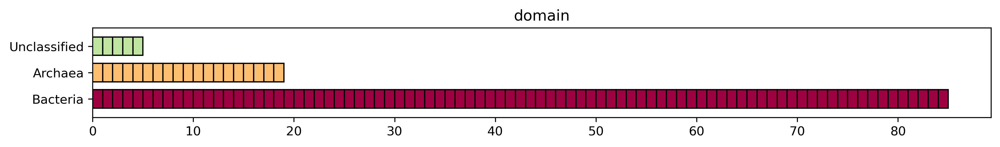

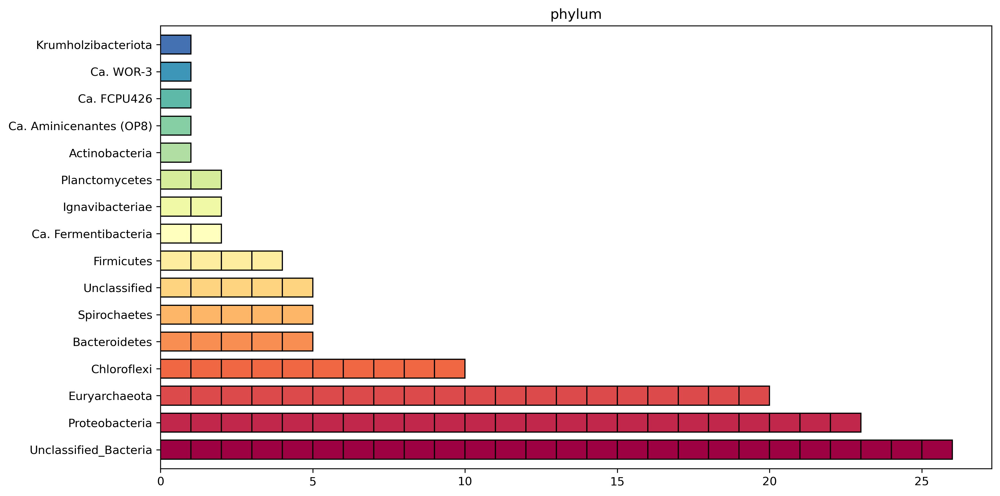

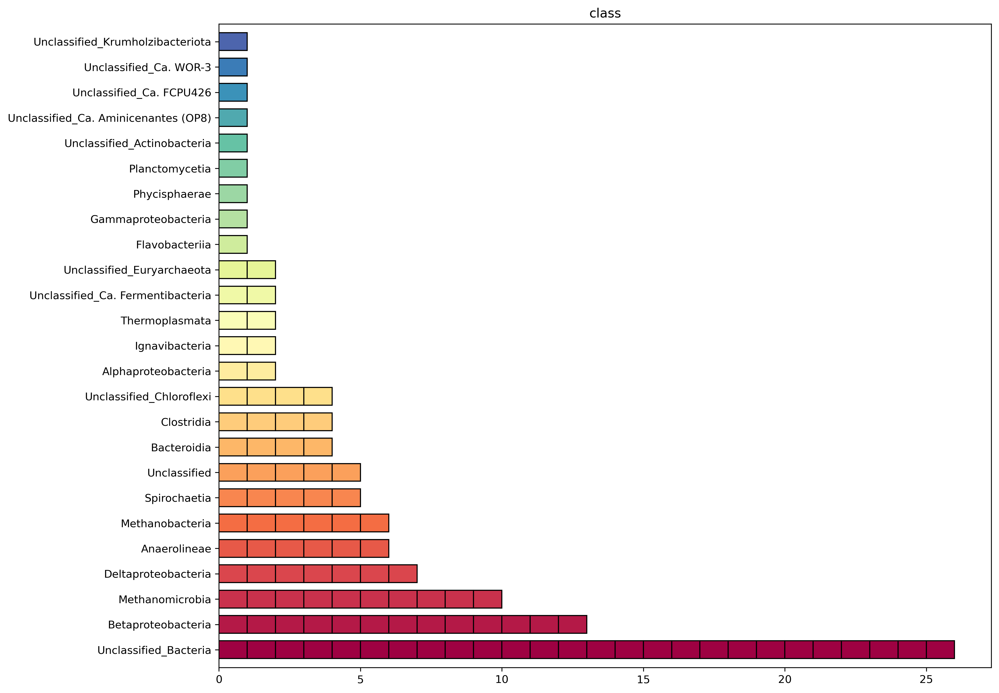

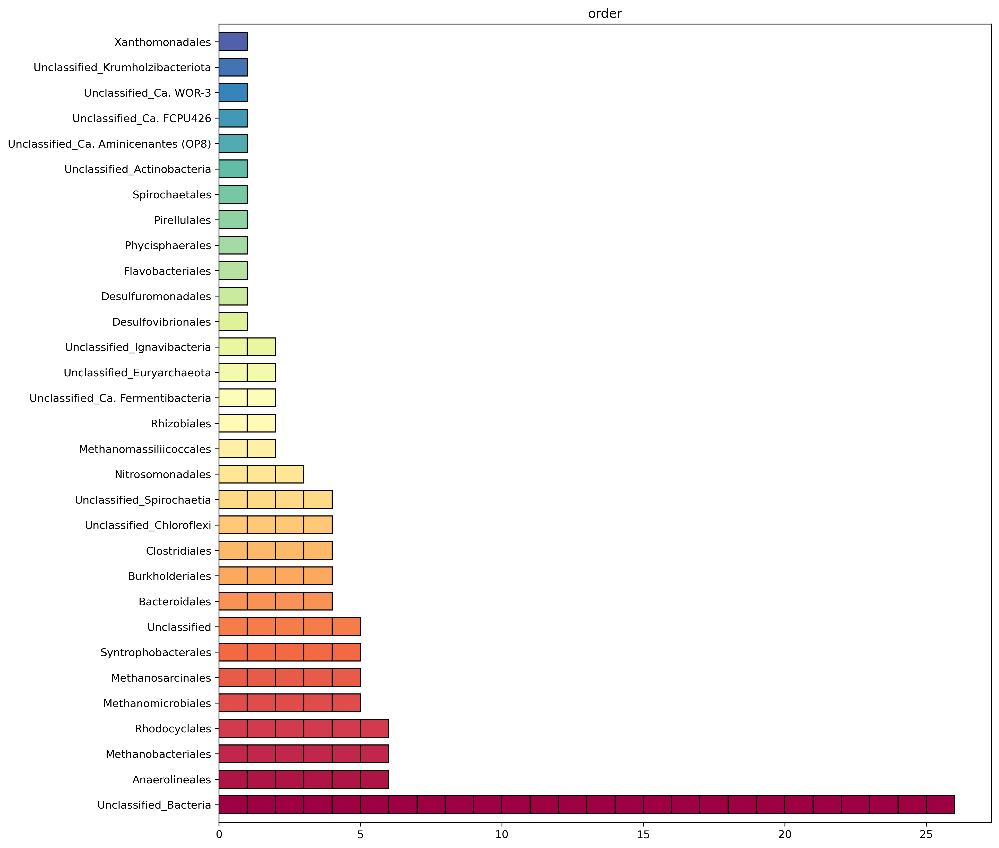

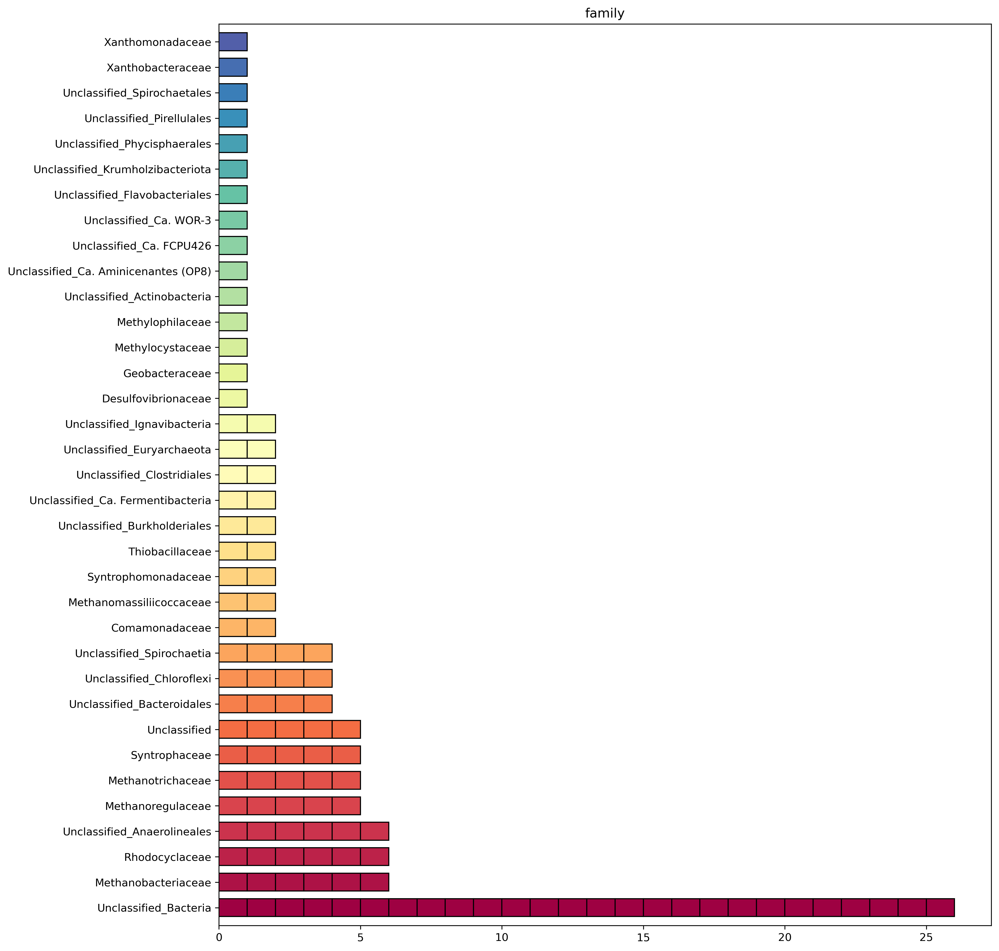

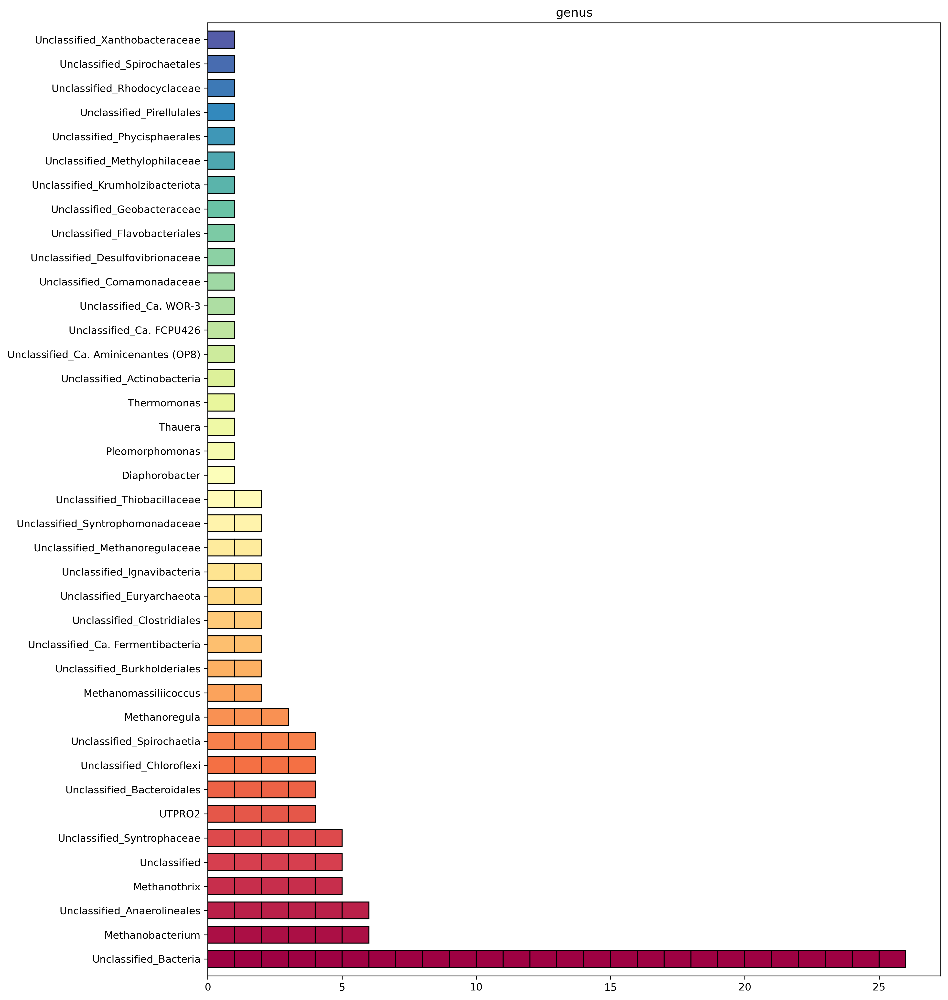

In [11]:
plot_bin_taxonomy(wte)

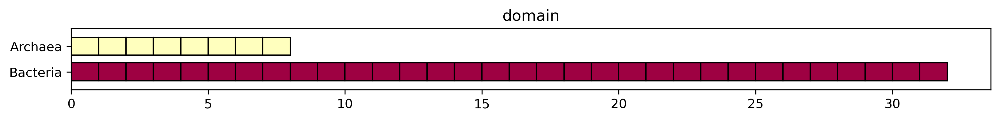

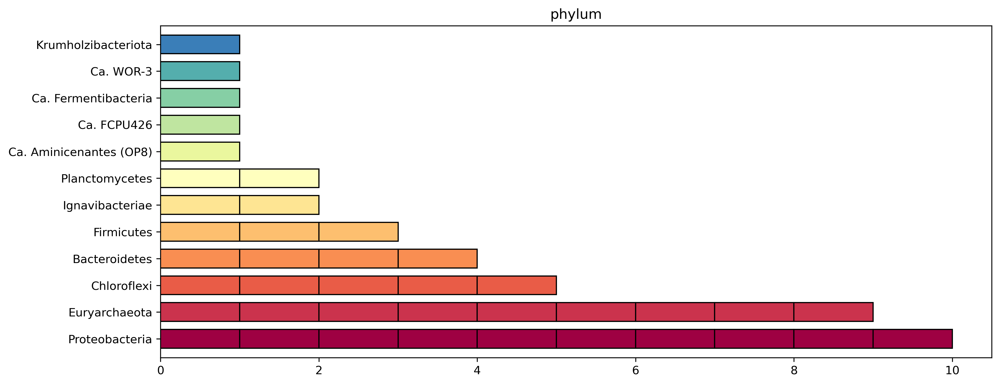

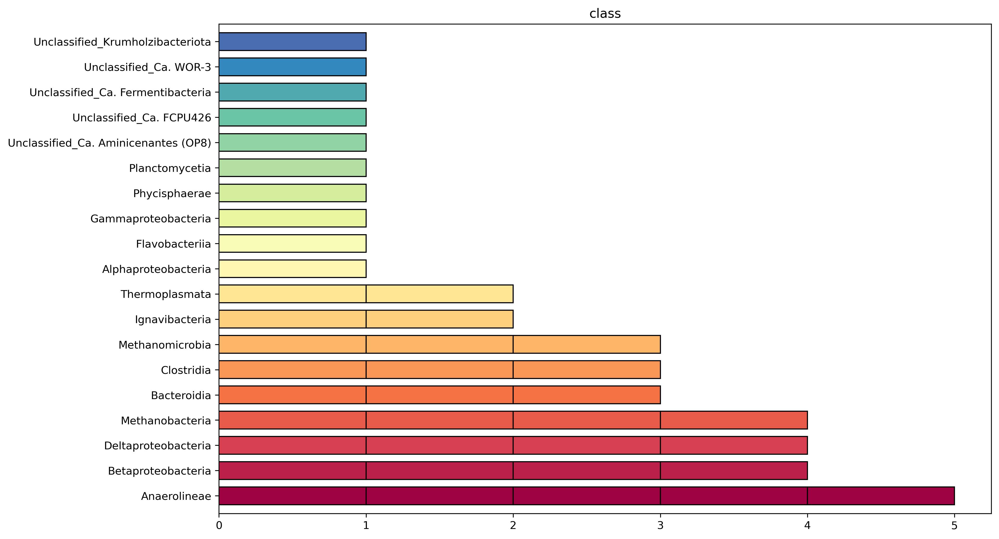

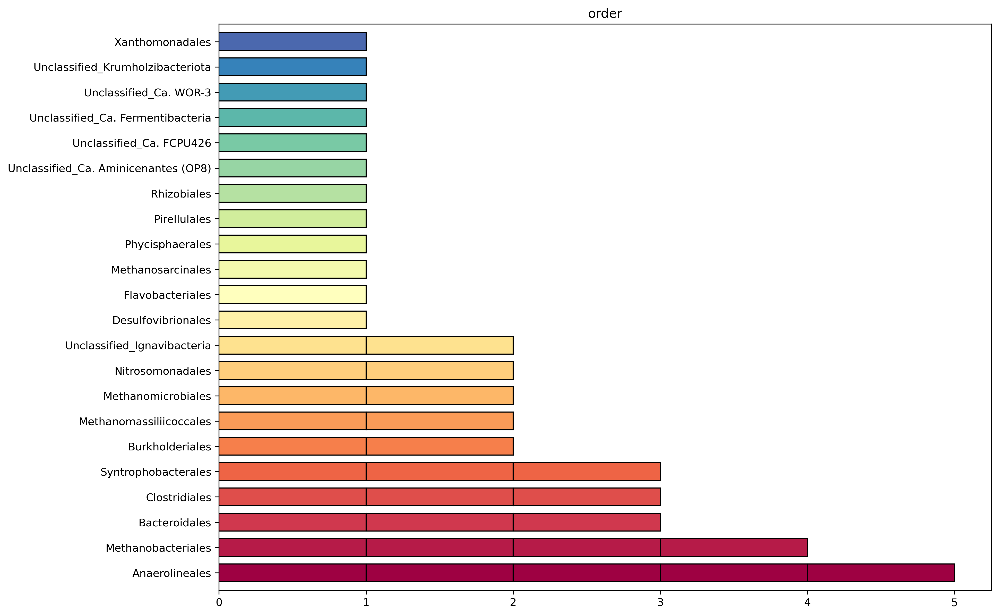

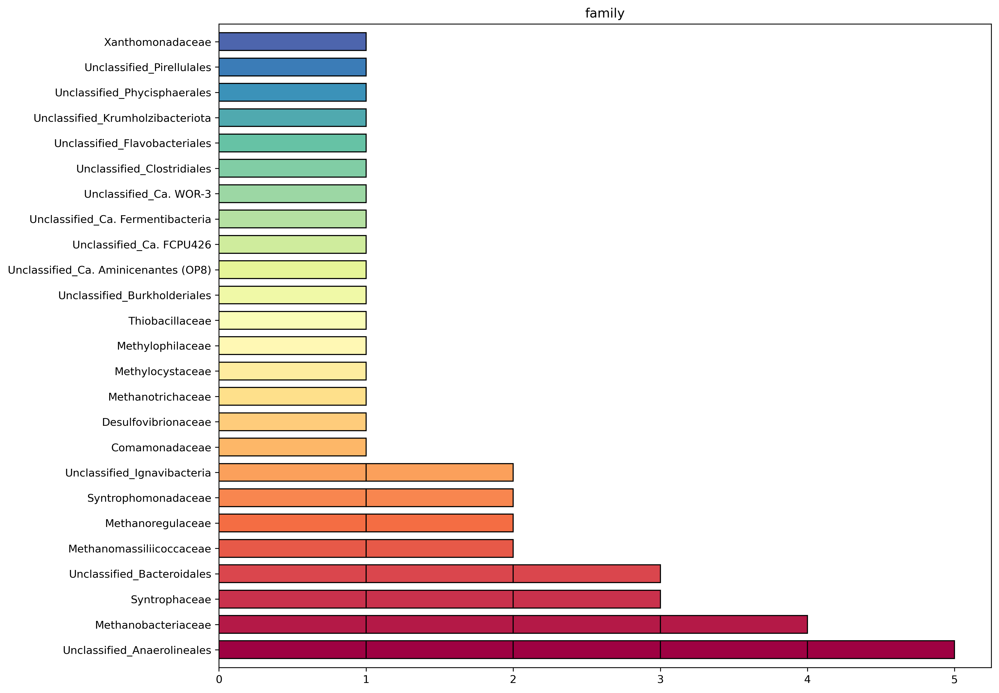

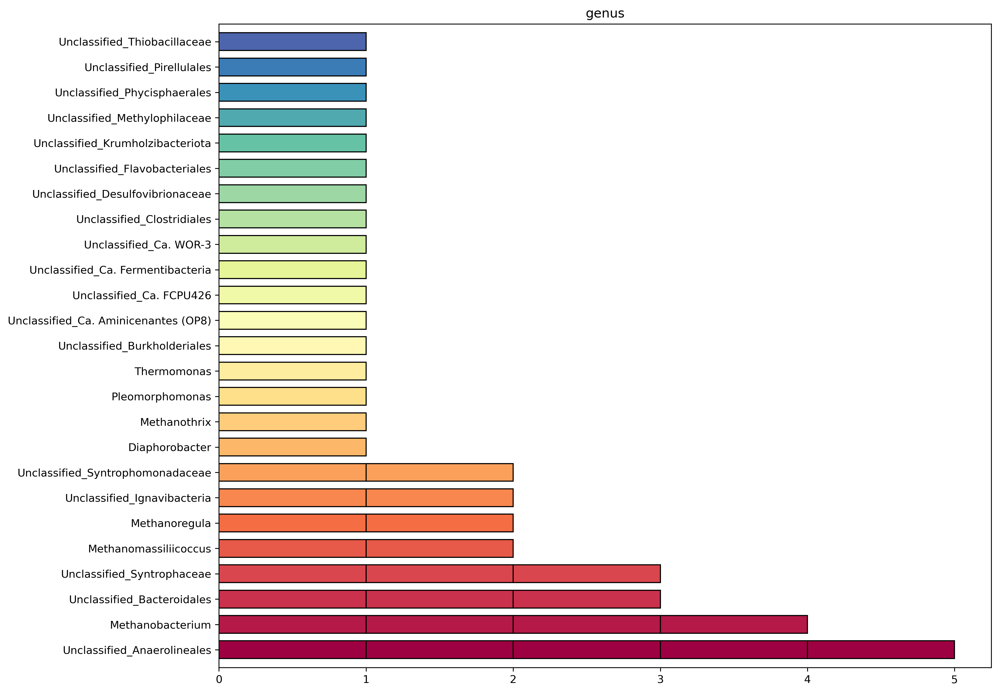

In [12]:
plot_bin_taxonomy(wte, bin_list=hq_bins)

# Now look at distribution of bins with metagenome abundance data included (i.e. bin RPKM stats)


## First we need sam files that list all reads mapped to each sequence (i.e. contig or scaffold)
- The sam files are obtained from aligning filtered read libraries against the assembled sequences
    - In this case the three Illumina libraries used for the assembly were aligned using **bowtie2**
    
- **bowtie2** was run with the following options:
 - create the database:
    
 - align the reads:
 
    $ bowtie2 -x ./home/sjb/zab/wte_download_seq_data/hybridassembly_bt2_db/wte_hybrid -U ### --no-unal --no-head --no-sq -p 12 -S ###.sam$


## Then use total read aligments to calculate RPKM per genome bin

### RPKM =  Reads Per Kilobase of transcript (or assembly) per Million mapped reads

- a = count total mapped reads per sample and divide by 1,000,000 = "per million" scaling factor
- b = count mapped reads per MAG (bin),contig, gene, transcript, etc...
- c = a/b = divide mapped reads per unit of interest (MAG, etc..) by "per million" scaling factor = RPM
- d = c/(length (divided by 1000)) = divide RPM values by length (divided by 1000) of unit of interest (MAG, etc...)

In [13]:
samA = './data/read_mapping/A.sam'
samB = './data/read_mapping/B.sam'
samC = './data/read_mapping/C.sam'
sam_files = [samA, samB, samC]
sam_file_names = ['A', 'B', 'C']

### Functions to read in sam files, count mapped reads, and calculate RPKM values

In [16]:

#------------------------------------------------------------------#
# Functions for working with SAM files
#------------------------------------------------------------------#
#
# self.assembly_dict[binID] = {'nodes':[], \
#                              'lengths':[], \
#                              'bin_length':0, \
#                              'mapped_counts':[], \
#                              'rpkm':[], \
#                              'genes':{}}
#
# self.sam_files_list = [] #_list of sam file paths for read mapping based analyses
# self.sam_files_names = [] #_list of simple names for sam files

def get_mapped_read_counts_for_bins_from_sam (self, sam_files, sam_file_names):
    if type(sam_files) != list:
        sam_files = [sam_files]
    if type(sam_file_names) != list:
        sam_file_names = [sam_file_names]
    all_read_counts = []
    # Progress Bar #
    fp = FloatProgress(min=0, max=len(sam_files))
    display(fp)
    progress = 0
    for (sam_file, sam_file_name) in zip(sam_files, sam_file_names):
        #print(f"counting mapped reads in: {sam_file}")
        fp.value = progress
        progress += 1
        self.sam_files_list.append(sam_file)
        self.sam_files_names.append(sam_file_name)
        self.sam_files_mapped_counts.append(0)
        sam_index = len(self.sam_files_list) - 1
        for binID in self.assembly_dict:
            self.assembly_dict[binID]['mapped_counts'].append(0)
            self.assembly_dict[binID]['rpkm'].append(0)
        with open(sam_file) as inF:
            for line in inF:
                line_list = line.strip().split('\t')
                header = line_list[2]
                header_list = header.split('|')
                binID = header_list[0]
                nodeID = header_list[1]
                self.assembly_dict[binID]['mapped_counts'][sam_index] += 1
                self.sam_files_mapped_counts[sam_index] += 1
        inF.close()
        all_read_counts.append(self.sam_files_mapped_counts[sam_index])
    fp.value = progress
    mapped_counts_df = pd.DataFrame(list(zip(sam_file_names,all_read_counts)))
    mapped_counts_df.columns = ['SAM file', 'mapped reads']
    display(mapped_counts_df)

def calc_bin_rpkm_stats (self):
    perMil = [x/1000000.0 for x in self.sam_files_mapped_counts]
    for binID in self.assembly_dict:
        total_length = self.assembly_dict[binID]['bin_length']
        kilobases = total_length/1000.0
        for i in range(len(perMil)):
            scaling_factor = perMil[i]
            mapped_count = self.assembly_dict[binID]['mapped_counts'][i]
            self.assembly_dict[binID]['rpkm'][i] = mapped_count/scaling_factor/kilobases
                
def print_bin_rpkm_data (self, bin_list = '', sam_list = '', file_name = ''):
    if not sam_list:
        sam_list = self.sam_files_names
    sam_index = [self.sam_files_names.index(i) for i in sam_list]
    #print(f'sam list:{len(sam_list)}\nindex: {len(sam_index)}')
    column_names = ["BinId"] + sam_list
    if not bin_list:
        bin_list = self.assembly_dict.keys()
    rpkm_data = []
    if file_name:
        header = '\t'.join(column_names)
        fOUT = io.open(file_name, 'a')
        fOUT.write(f'#{header}\n')
    for binID in bin_list:
        bin_data = [binID] + [self.assembly_dict[binID]['rpkm'][x] for x in sam_index]
        rpkm_data.append(bin_data)
        if file_name:
            line_data = [str(x) for x in bin_data]
            line = '\t'.join(line_data)
            fOUT.write(f'{line}\n')
    rpkm_df = pd.DataFrame(rpkm_data, columns =column_names)
    if file_name:
        fOUT.close()
        #rpkm_df.to_csv(file_name, sep="\t")
    display(rpkm_df)
    
    
def rpkm_to_array (self, bin_list='', sam_list=''):
    if not bin_list:
        bin_list = self.assembly_dict.keys()
    if not sam_list:
        sam_list = self.sam_files_names
    sam_index = [self.sam_files_names.index(i) for i in sam_list]
    rpkm_array = []
    for binID in bin_list:
        bin_rpkm_data = [self.assembly_dict[binID]['rpkm'][x] for x in sam_index]
        rpkm_array.append(bin_rpkm_data)
    r_arr = np.asarray(rpkm_array)
    return(r_arr)


def load_rpkm_from_file (self, input_file_name):
    #_Reading data from a saved tsv file, faster than processing multiple sam files
    print("\t<> loading bin rpkm data from: "+ input_file_name)
    with open(input_file_name) as inF:
        for line in inF:
            if line[0] == '#':
                line_list = line.strip().split('\t')
                header = line_list[1:]
                self.sam_files_names = header
            elif line[0] != '#':
                line_list = line.strip().split('\t')
                binID = line_list[0]
                rpkm_counts = [float(x) for x in line_list[1:]]
                if binID in self.assembly_dict:
                    self.assembly_dict[binID]['rpkm'] = rpkm_counts
                    #print(f'{binID} | {rpkm_counts}')
    inF.close()


In [92]:
get_mapped_read_counts_for_bins_from_sam(wte, sam_files, sam_file_names)

FloatProgress(value=0.0, max=3.0)

,SAM file,mapped reads
0,A,40964628
1,B,41183181
2,C,40926070


In [93]:
calc_bin_rpkm_stats(wte)

In [94]:
print_bin_rpkm_data(wte, bin_list = hq_bins, sam_list = '', file_name = '')

,BinId,A,B,C
0,wte_bin003,16.148900,16.867479,23.861399
1,wte_bin004,15.385300,7.659159,14.456037
2,wte_bin005,15.097984,18.458858,16.392862
3,wte_bin006,13.808231,11.338469,12.984294
4,wte_bin007,9.154069,2.906648,5.647952
5,wte_bin008,7.127166,2.863929,5.321828
6,wte_bin010,6.451990,7.757152,6.702997
7,wte_bin012,5.914711,0.614117,5.916482
8,wte_bin015,5.211385,4.264783,3.771226
9,wte_bin018,4.350757,7.324302,6.433808


## Summarize and plot bin RPKM data by taxonomy at different phylogenetic ranks

In [17]:
   
#------------------------------------------------------------------#
# mapped read summary by rank
#------------------------------------------------------------------#

def summarize_rpkm_by_bin_taxonomy (self, sam_list='', bin_list='', plot_df=False, taxonomic_rank=''):
    
    if not sam_list:
        sam_list = self.sam_files_names
    sam_index = [self.sam_files_names.index(i) for i in sam_list]
    if taxonomic_rank:
        ranks_list = [taxonomic_rank]
    else:
        ranks_list = ['domain','phylum','class','order','family','genus']
    self.taxonomy_rpkm_summary = {'domain':{},'phylum':{},'class':{},'order':{},'family':{},'genus':{}}
    
    if not bin_list:
        bin_list = self.assembly_dict.keys()
    for binID in bin_list:
        #[D,P,C,O,F,G] = [self.assembly_dict[binID]['taxonomy'].get(rank,'Unclassified') for rank in ranks_list]
        bin_rpkm_data = [self.assembly_dict[binID]['rpkm'][i] for i in sam_index]
        for rank in ranks_list:
            taxa = self.assembly_dict[binID]['taxonomy'].get(rank,'Unclassified')
            if taxa not in self.taxonomy_rpkm_summary[rank]:
                rpkm_sum = bin_rpkm_data
            else:
                rpkm_sum = [x + y for (x,y) in zip(bin_rpkm_data,self.taxonomy_rpkm_summary[rank][taxa])]
            self.taxonomy_rpkm_summary[rank][taxa] = rpkm_sum
    #_print out taxa totals from dataframe
    for rank in ranks_list:
        col1 = rank + ' | taxa'
        rpkm_data = []
        column_names = [col1] + sam_list
        avg_rpkm = []
        for taxa in self.taxonomy_rpkm_summary[rank]:
            average_rpkm = np.mean(self.taxonomy_rpkm_summary[rank][taxa])
            vals = (taxa, average_rpkm)
            avg_rpkm.append(vals)
        avg_rpkm.sort(key = lambda x : (-x[1], x[0]))
        taxa_list = [x for (x,y) in avg_rpkm]
        for t in taxa_list:
            bin_count = self.bin_taxa_counts[rank][t]
            t_name = f'({bin_count})_{t}'
            t_data = [t_name] + self.taxonomy_rpkm_summary[rank][t]
            rpkm_data.append(t_data)
        rpkm_df = pd.DataFrame(rpkm_data, columns=column_names)
        rpkm_df.style.set_caption(rank)
        if plot_df == False:
            display(rpkm_df)
        else:
            rpkm_df.plot.barh(x=col1, figsize=(12,len(taxa_list)/3))
            plt.legend(bbox_to_anchor=(1.01, 1.0), loc='upper left', borderaxespad=0)
        

### Number of bins in each taxon in parenthesis prior to name (e.g. (#)_Name)

In [152]:
summarize_rpkm_by_bin_taxonomy(wte)

,domain | taxa,A,B,C
0,(85)_Bacteria,153.163085,163.077531,150.751130
1,(19)_Archaea,131.379677,134.909024,132.807628
2,(5)_Unclassified,7.463608,11.078065,7.118024


,phylum | taxa,A,B,C
0,(20)_Euryarchaeota,132.319352,135.713598,133.790664
1,(23)_Proteobacteria,67.098109,91.784540,68.921526
2,(26)_Unclassified_Bacteria,18.467920,19.358241,19.109903
3,(5)_Bacteroidetes,11.113309,15.354996,12.740086
4,(1)_Ca. Aminicenantes (OP8),15.385300,7.659159,14.456037
5,(10)_Chloroflexi,12.023069,9.837924,11.220791
6,(5)_Unclassified,7.463608,11.078065,7.118024
7,(1)_Krumholzibacteriota,9.154069,2.906648,5.647952
8,(1)_Ca. WOR-3,7.127166,2.863929,5.321828
9,(2)_Ca. Fermentibacteria,3.405271,2.556649,3.433208


,class | taxa,A,B,C
0,(10)_Methanomicrobia,99.470824,96.144183,95.568085
1,(13)_Betaproteobacteria,40.313991,62.614650,39.939085
2,(6)_Methanobacteria,24.483910,31.823818,30.751692
3,(7)_Deltaproteobacteria,25.652846,20.320159,24.692790
4,(26)_Unclassified_Bacteria,18.467920,19.358241,19.109903
5,(1)_Unclassified_Ca. Aminicenantes (OP8),15.385300,7.659159,14.456037
6,(4)_Bacteroidia,10.509153,14.234952,12.237985
7,(5)_Unclassified,7.463608,11.078065,7.118024
8,(6)_Anaerolineae,9.680754,6.997460,8.876220
9,(2)_Unclassified_Euryarchaeota,6.583392,5.948201,5.607601


,order | taxa,A,B,C
0,(5)_Methanosarcinales,77.007488,73.478931,64.751030
1,(6)_Rhodocyclales,24.694621,46.038893,23.947977
2,(6)_Methanobacteriales,24.483910,31.823818,30.751692
3,(5)_Methanomicrobiales,22.463336,22.665252,30.817055
4,(5)_Syntrophobacterales,23.713233,17.896836,22.368764
5,(26)_Unclassified_Bacteria,18.467920,19.358241,19.109903
6,(1)_Unclassified_Ca. Aminicenantes (OP8),15.385300,7.659159,14.456037
7,(4)_Bacteroidales,10.509153,14.234952,12.237985
8,(4)_Burkholderiales,9.243016,12.452392,9.272478
9,(5)_Unclassified,7.463608,11.078065,7.118024


,family | taxa,A,B,C
0,(5)_Methanotrichaceae,77.007488,73.478931,64.751030
1,(6)_Rhodocyclaceae,24.694621,46.038893,23.947977
2,(6)_Methanobacteriaceae,24.483910,31.823818,30.751692
3,(5)_Methanoregulaceae,22.463336,22.665252,30.817055
4,(5)_Syntrophaceae,23.713233,17.896836,22.368764
5,(26)_Unclassified_Bacteria,18.467920,19.358241,19.109903
6,(1)_Unclassified_Ca. Aminicenantes (OP8),15.385300,7.659159,14.456037
7,(4)_Unclassified_Bacteroidales,10.509153,14.234952,12.237985
8,(5)_Unclassified,7.463608,11.078065,7.118024
9,(6)_Unclassified_Anaerolineales,9.680754,6.997460,8.876220


,genus | taxa,A,B,C
0,(5)_Methanothrix,77.007488,73.478931,64.751030
1,(4)_UTPRO2,23.971928,44.747422,23.175531
2,(6)_Methanobacterium,24.483910,31.823818,30.751692
3,(3)_Methanoregula,19.202024,19.658782,27.325415
4,(5)_Unclassified_Syntrophaceae,23.713233,17.896836,22.368764
5,(26)_Unclassified_Bacteria,18.467920,19.358241,19.109903
6,(1)_Unclassified_Ca. Aminicenantes (OP8),15.385300,7.659159,14.456037
7,(4)_Unclassified_Bacteroidales,10.509153,14.234952,12.237985
8,(5)_Unclassified,7.463608,11.078065,7.118024
9,(6)_Unclassified_Anaerolineales,9.680754,6.997460,8.876220


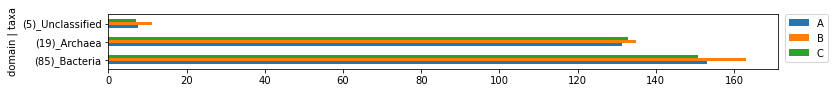

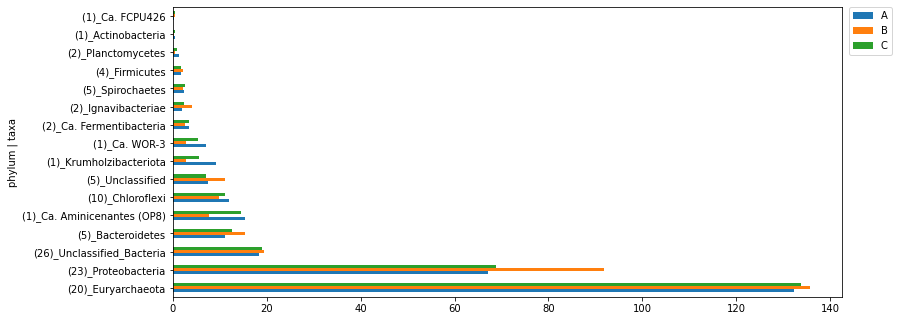

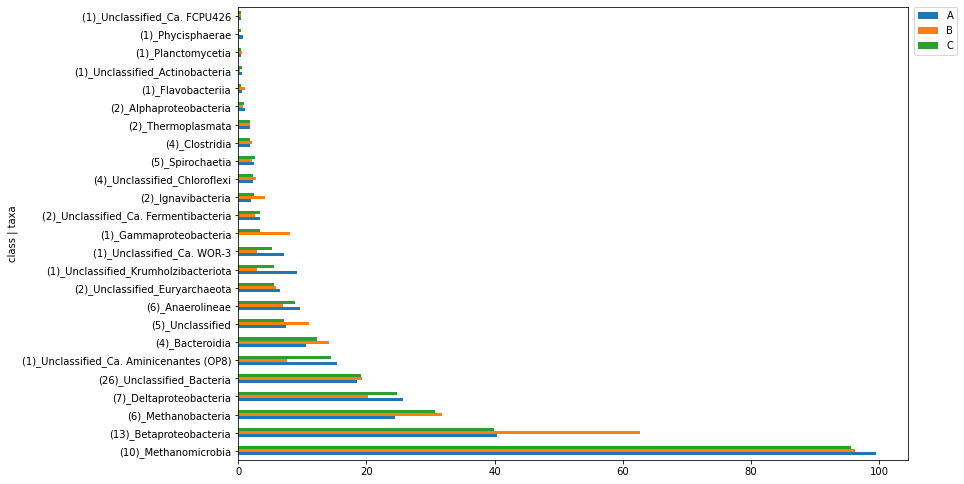

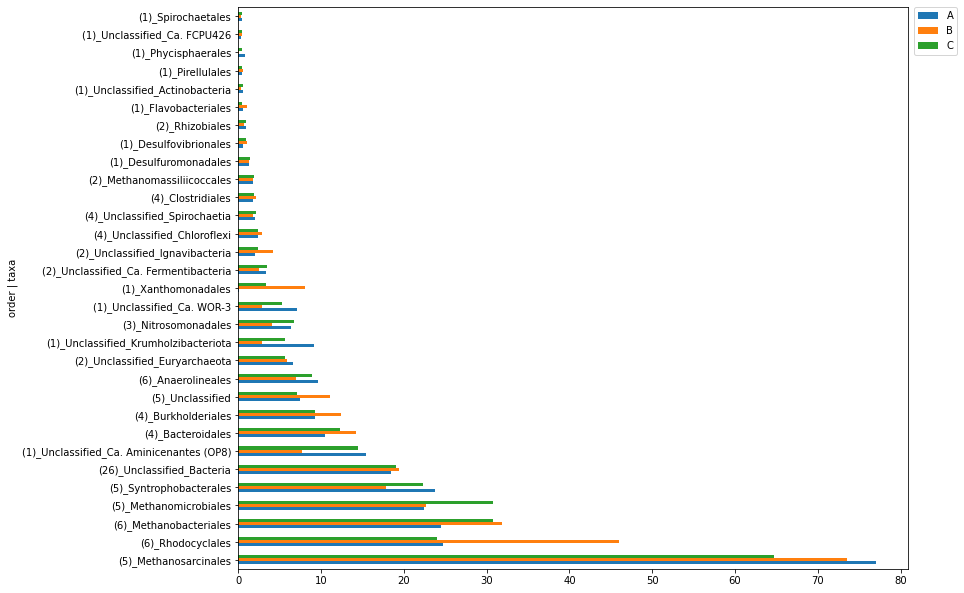

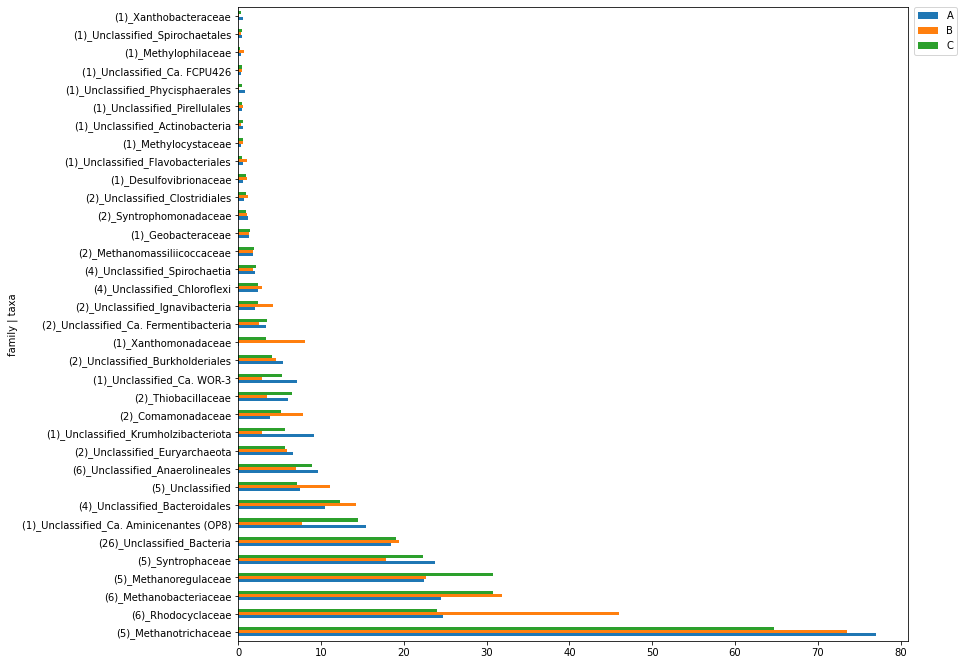

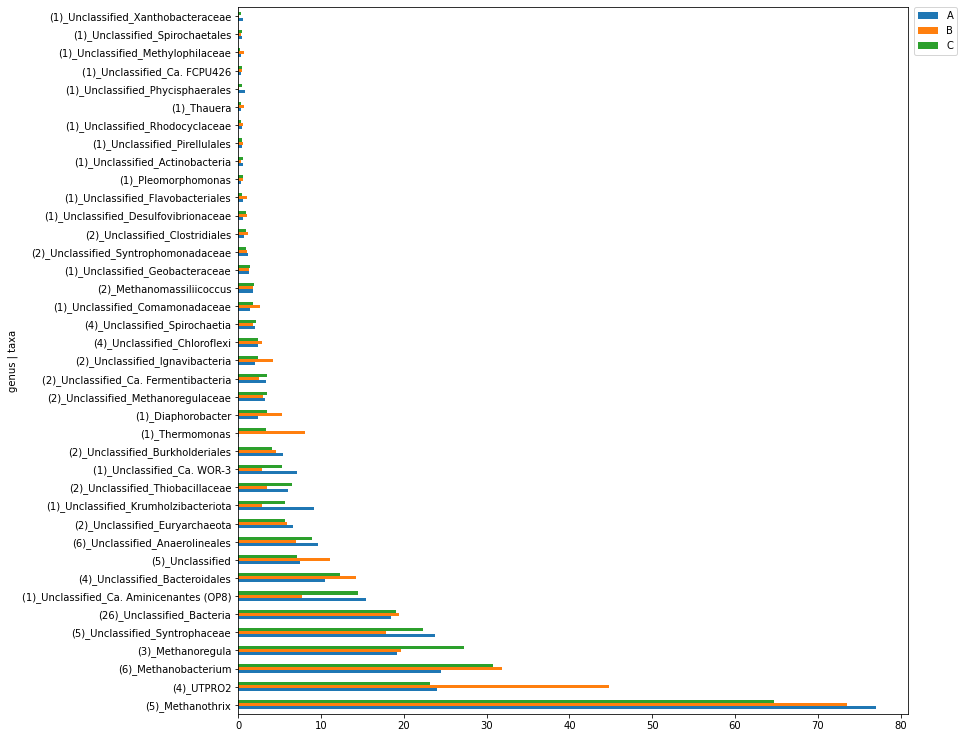

In [153]:
summarize_rpkm_by_bin_taxonomy(wte, plot_df=True)

# Now look at functional content of bins, based on annotations that include
### - COG categories (very broad)
### - CAZyme annotations (specific for carbohydrate or other polymer metabolism)
### - Kegg Ontology (KO) annotations



### #####################################################################

## Need some functions for organizing annotation counts and generating bi-cluster heatmaps
- Transform the data for visualization in the heatmap
- Generate the figure

In [20]:
def transform_array_log_norm_scale (arr, scaled_range=4):
    arr = np.asarray(arr)
    arr = arr.astype('float')
    arr[arr == 0] = 'nan' 
    arr = np.log10(arr)
    arr = scipy.stats.zscore(arr, axis=0, ddof=0, nan_policy='omit')
    arr = arr.transpose()
    for x in range(len(arr)):    
        min_v = np.nanmin(arr[x])
        max_v = np.nanmax(arr[x])
        range_v = max_v - min_v
        scaler = scaled_range/range_v
        mid_v = (range_v/2) + min_v
        arr[x] = (arr[x] - mid_v) * scaler
    arr = arr.transpose()
    return(arr)

In [21]:
def bi_cluster_heatmap_data (data_array, row_list, column_list, colormap = "cividis", plot_name = "",
                        cmin=-2, cmax=2, scaled_range=4, pdist_metric='correlation'):
    # make matrix for vertical clustering
    v_data_array = np.transpose(data_array)
    v_distance_array = scipy.spatial.distance.pdist(v_data_array, pdist_metric)
    v_distance_array = scipy.spatial.distance.squareform(v_distance_array)
    v_linkage_array = scipy.cluster.hierarchy.linkage(v_distance_array, method='average')
    
    #make matrix for horizontal clustering
    h_data_array = data_array
    h_distance_array = scipy.spatial.distance.pdist(h_data_array, pdist_metric)
    h_distance_array = scipy.spatial.distance.squareform(h_distance_array)
    h_linkage_array = scipy.cluster.hierarchy.linkage(h_distance_array, method='average')
    # plot clusters
    fig = plt.figure(figsize=(8,3+len(row_list)/4),dpi=300)
    gs = gridspec.GridSpec(3, 2,width_ratios=[2,3], height_ratios=[1,6,1], wspace=0.0, hspace=0.0) #
    ax1 = plt.subplot(gs[0,0]) #top-left --> empty
    ax2 = plt.subplot(gs[0,1]) #top-right --> vertical cluster
    ax3 = plt.subplot(gs[1,0]) #middle-left --> horizontal cluster
    ax4 = plt.subplot(gs[1,1]) #middle-right --> heatmap
    ax5 = plt.subplot(gs[2,0]) #bottom-left --> empty
    ax6 = plt.subplot(gs[2,1], sharex=ax4) # bottom-right --> heatmap colormap
    # empty spaces
    ax1.axis('off')
    ax5.axis('off')
    ax6.axis('off')
    # vertical dendrogram
    V = scipy.cluster.hierarchy.dendrogram(v_linkage_array, labels = column_list,no_labels=True, ax = ax2)
    v = V['leaves']
    columns = [column_list[i] for i in v]
    # horizontal dendrogram
    H = scipy.cluster.hierarchy.dendrogram(h_linkage_array, orientation='left', labels = row_list,no_labels=True, ax = ax3)
    h = H['leaves']
    rows = [row_list[i] for i in h]
    # make heatmap data_array with lognormalized and scaled data
    
    data_scaled = transform_array_log_norm_scale(data_array, scaled_range=scaled_range)
    data = []
    #h.reverse()
    for r in h:
        r_data = [data_scaled[r][c] for c in v]
        data.append(r_data)
    data = np.asarray(data)
    ax4.pcolor(data, vmin=cmin, vmax=cmax, cmap=plt.get_cmap(colormap),edgecolors='k', linewidth=1)
    ax4.set_xticks(np.arange(0,len(columns))+0.5)
    ax4.set_yticks(np.arange(0,len(data_array))+0.5)
    ax4.xaxis.tick_bottom()
    ax4.yaxis.tick_right()
    ax4.set_xticklabels(columns,minor=False,fontsize=5, rotation=90)
    ax4.set_yticklabels(rows,minor=False,fontsize=7)
    ax4.set_xlim(0,len(columns))
    ax4.set_ylim(0,len(rows))
    ax4.grid(color='black', linestyle='-', linewidth=1)
    ax2.set_xticklabels([])
    ax3.set_yticklabels([])
    #fig.subplots_adjust(wspace=0)
    #fig.subplots_adjust(hspace=0.1)
    #add heatmap legend#
    bar = ax4.pcolormesh(data, vmin=cmin, vmax=cmax, cmap=plt.get_cmap(colormap))
    cbar = fig.colorbar(bar, ax=ax6, orientation='horizontal', fraction=0.5, pad=0.05)
    if plot_name:
        plt.savefig(plot_name)
    plt.show()

## Compare COG category counts across bins
- generate tabular data output
- clustered heatmap

- A : RNA processing and modification
- B : Chromatin Structure and dynamics
- C : Energy production and conversion
- D : Cell cycle control and mitosis
- E : Amino acid transport and metabolism
- F : Nucleotide transport and metabolism
- G : Carbohydrate transport and metabolism
- H : Coenzyme transport and metabolism
- I : Lipid transport and metabolism
- J : Translation, ribosomal structure and biogenesis
- K : Transcription
- L : Replication, recombination and repair
- M : Cell wall/membrane/envelope biogenesis
- N : Cell Motility
- O : Posttranslational modification, protein turnover, chaperones
- P : Inorganic ion transport and metabolism
- Q : Secondary metabolites biosynthesis, transport and catabolism
- R : General function prediction only
- S : Function unknown
- T : Signal transduction mechanisms
- U : Intracellular trafficking, secretion, and vesicular transport
- V : Defense mechanisms
- W : Extracellular structures
- X : Unclassified
- Y : Nuclear structure
- Z : Cytoskeleton
- na : not assigned

### Limit categories to the ones interesting for Bacteria and Archaea

In [23]:
cog_cats = ['C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','S','T','U','V']

### Some functions for summung up the COG annotation data in the MetagenomeAssembly object

In [19]:
    
#------------------------------------------------------------------#
# Functions for working with COG category annotations
#------------------------------------------------------------------#
#
# self.assembly_dict[binID] = {'nodes':[], \
#                              'lengths':[], \
#                              'bin_length':0, \
#                              'mapped_counts':[], \
#                              'rpkm':[], \
#                              'genes':{}}
# self.assembly_dict[binID]['genes'][geneID]['COG'] = [(cat1, count1),(cat2, count2)]
# COG category assignments can be one letter (e.g. "A") or two letters (e.g. "AB")
# For those with more than one letter, counts are split
# self.cog_counts_by_bin[binID][cog_cat] = cog_count
    

def sum_cog_category_counts_by_bin (self, bin_list='' ):
    cog_dict = {} #_Dictionary for adding up bins with each COG annotation present
    self.cog_counts_by_bin = {} #_Stores COG counts for each bin (dict[binID][COG] = count)
    self.cog_category_list = []
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    for binID in bin_list:
        self.cog_counts_by_bin[binID] = {}
        for geneID in self.assembly_dict[binID]['genes']:
            if 'COG' in self.assembly_dict[binID]['genes'][geneID]:
                cog_categories = self.assembly_dict[binID]['genes'][geneID]['COG']
                for (cog_cat, cog_count) in cog_categories:
                    if cog_cat not in self.cog_counts_by_bin[binID]:
                        self.cog_counts_by_bin[binID][cog_cat] = cog_count
                    else:
                        self.cog_counts_by_bin[binID][cog_cat] += cog_count
                    if cog_cat not in self.cog_category_list:
                        self.cog_category_list.append(cog_cat)               
                
                
# Get an output with gene counts for each COG category   
def print_bin_cog_category_data (self, bin_list='',cog_category_list='', file_name=''):
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    if not cog_category_list:
        cog_category_list = self.cog_category_list
    
    cog_category_index = bin_list
    column_names = ["BinId"] + cog_category_list
    cog_category_data = []
    for binID in bin_list:
        bin_data = [binID]
        for cog_cat in cog_category_list:
            if cog_cat in self.cog_counts_by_bin[binID]:
                cog_count = self.cog_counts_by_bin[binID][cog_cat]
            else:
                cog_count = 0.0
            bin_data.append(cog_count)
        cog_category_data.append(bin_data)
    cog_category_df = pd.DataFrame(cog_category_data, columns=column_names)
    if file_name:
        cog_category_df.to_csv(file_name, sep="\t")
    display(cog_category_df)

def cog_counts_to_array (self, bin_list='', cog_category_list=''):
    if not bin_list:
        bin_list = self.assembly_dict.keys()
    if not cog_category_list:
        cog_category_list = self.cog_category_list
    cog_array = []
    for binID in bin_list:
        bin_cog_data = []
        for cog_cat in cog_category_list:
            c = 0.0
            if cog_cat in self.cog_counts_by_bin[binID]:
                c = self.cog_counts_by_bin[binID][cog_cat]
            bin_cog_data.append(c)
        cog_array.append(bin_cog_data)
    cog_array = np.asarray(cog_array)
    return(cog_array)

def cog_descriptions(self):
    self.cog_category_descriptions = {'A':'RNA processing and modification',
                                      'B':'Chromatin Structure and dynamics',
                                      'C':'Energy production and conversion',
                                      'D':'Cell cycle control and mitosis',
                                      'E':'Amino acid transport and metabolism',
                                      'F':'Nucleotide transport and metabolism',
                                      'G':'Carbohydrate transport and metabolism',
                                      'H':'Coenzyme transport and metabolism',
                                      'I':'Lipid transport and metabolism',
                                      'J':'Translation, ribosomal structure and biogenesis',
                                      'K':'Transcription',
                                      'L':'Replication, recombination and repair',
                                      'M':'Cell wall/membrane/envelope biogenesis',
                                      'N':'Cell Motility',
                                      'O':'Posttranslational modification, protein turnover, chaperones',
                                      'P':'Inorganic ion transport and metabolism',
                                      'Q':'Secondary metabolites biosynthesis, transport and catabolism',
                                      'R':'General function prediction only',
                                      'S':'Function unknown',
                                      'T':'Signal transduction mechanisms',
                                      'U':'Intracellular trafficking, secretion, and vesicular transport',
                                      'V':'Defense mechanisms',
                                      'W':'Extracellular structures',
                                      'X':'Unclassified',
                                      'Y':'Nuclear structure',
                                      'Z':'Cytoskeleton',
                                      'na':'not assigned'}


In [20]:
sum_cog_category_counts_by_bin(wte, bin_list=hq_bins)

In [21]:
print_bin_cog_category_data(wte, bin_list=hq_bins, cog_category_list=cog_cats, file_name='')

,BinId,C,D,E,F,G,H,I,J,K,L,M,N,O,P,Q,S,T,U,V
0,wte_bin003,198.000000,25.500000,147.000000,64.000000,74.500000,121.000000,19.500000,163.500000,109.333333,130.833333,117.000000,42.500000,104.500000,135.000000,35.500000,517.0,119.833333,15.000000,51.000000
1,wte_bin004,167.000000,27.500000,155.333333,79.500000,80.333333,107.000000,51.000000,156.333333,109.250000,127.250000,205.500000,11.833333,100.833333,110.833333,28.500000,406.0,125.416667,55.583333,41.000000
2,wte_bin005,244.000000,25.000000,176.666667,68.000000,64.000000,151.500000,38.833333,172.000000,164.833333,176.333333,119.000000,7.000000,63.000000,116.666667,62.000000,627.0,110.833333,16.500000,63.333333
3,wte_bin006,481.000000,56.500000,306.833333,122.500000,150.833333,193.000000,112.500000,204.000000,207.083333,404.583333,329.000000,84.250000,165.500000,258.583333,83.500000,1003.0,388.833333,90.500000,105.500000
4,wte_bin007,253.500000,41.000000,186.833333,92.500000,159.833333,124.000000,93.500000,171.333333,144.333333,141.500000,328.000000,57.666667,156.333333,141.666667,45.833333,524.0,173.000000,79.333333,63.000000
5,wte_bin008,175.500000,29.000000,83.500000,69.500000,71.500000,64.500000,57.500000,143.500000,73.333333,137.833333,162.500000,6.000000,94.000000,67.000000,47.500000,374.0,87.833333,33.500000,34.000000
6,wte_bin010,230.500000,48.000000,216.500000,94.000000,223.000000,140.500000,81.000000,163.500000,186.000000,282.166667,329.166667,23.666667,125.833333,171.000000,41.000000,747.0,130.000000,60.666667,84.500000
7,wte_bin012,237.000000,60.000000,146.000000,79.500000,89.000000,134.500000,64.500000,192.500000,154.166667,170.500000,237.750000,81.500000,152.583333,160.250000,41.500000,541.0,185.250000,102.500000,57.000000
8,wte_bin015,268.000000,36.833333,250.666667,99.500000,106.166667,149.833333,148.000000,196.666667,255.000000,201.166667,170.333333,73.166667,119.333333,198.666667,68.500000,666.0,217.666667,78.166667,59.000000
9,wte_bin018,197.000000,20.500000,142.666667,71.000000,63.666667,149.500000,26.500000,154.500000,132.833333,156.333333,94.500000,6.000000,64.500000,91.166667,35.000000,561.0,83.333333,19.000000,52.000000


In [22]:
cog_array = cog_counts_to_array (wte, bin_list=hq_bins, cog_category_list=cog_cats)

/tmp/ipykernel_32246/3743127127.py:7: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  v_linkage_array = scipy.cluster.hierarchy.linkage(v_distance_array, method='average')
/tmp/ipykernel_32246/3743127127.py:13: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  h_linkage_array = scipy.cluster.hierarchy.linkage(h_distance_array, method='average')


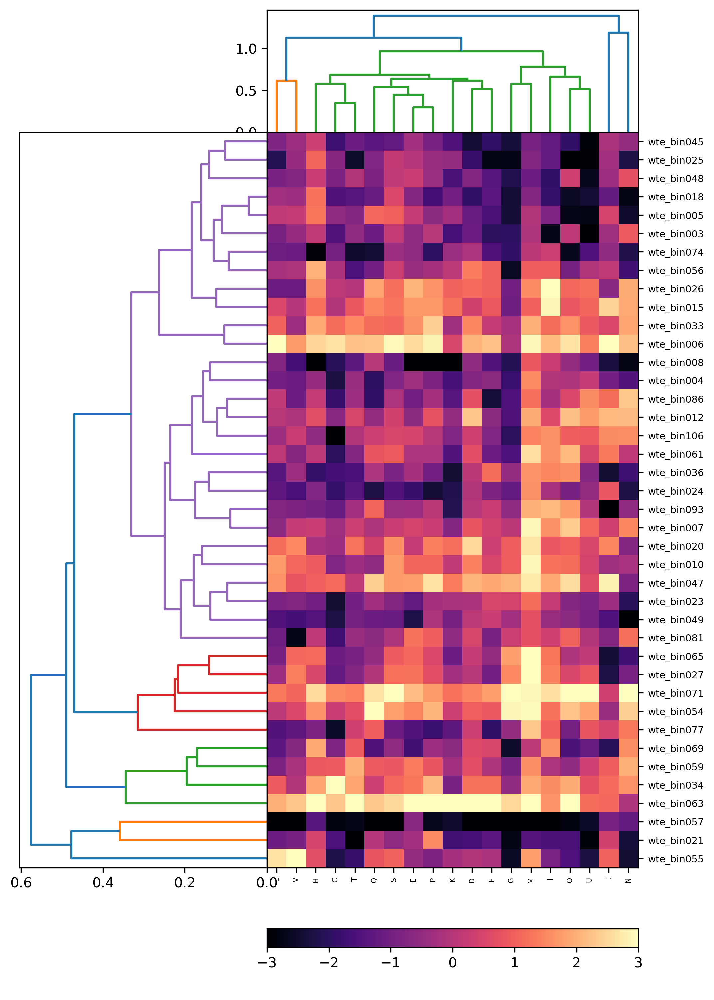

In [23]:
bi_cluster_heatmap_data (cog_array, hq_bins, cog_cats, colormap = "magma", plot_name = "",
                        cmin=-3, cmax=3, scaled_range=6, pdist_metric='correlation')

/tmp/ipykernel_32246/3743127127.py:7: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  v_linkage_array = scipy.cluster.hierarchy.linkage(v_distance_array, method='average')
/tmp/ipykernel_32246/3743127127.py:13: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  h_linkage_array = scipy.cluster.hierarchy.linkage(h_distance_array, method='average')


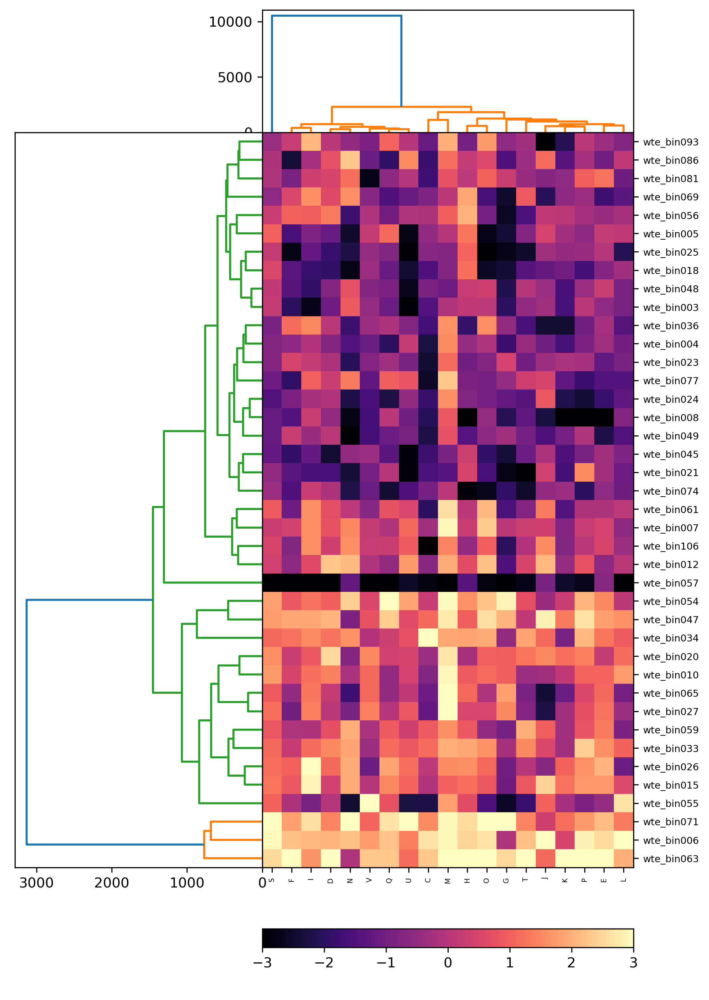

In [24]:
bi_cluster_heatmap_data (cog_array, hq_bins, cog_cats, colormap = "magma", plot_name = "",
                        cmin=-3, cmax=3, scaled_range=6, pdist_metric='euclidean')

## Compare CAZyme annotation counts across bins

### Some functions for summing up the CAZyme annotation data in the MetagenomeAssembly object

In [20]:
#------------------------------------------------------------------#
# Functions for working with CAZyme annotations
#------------------------------------------------------------------#      
#
# self.assembly_dict[binID] = {'nodes':[], \
#                              'lengths':[], \
#                              'bin_length':0, \
#                              'mapped_counts':[], \
#                              'rpkm':[], \
#                              'genes':{}}
# self.assembly_dict[binID]['genes'][geneID]['CAZy_funtion'] = functionID
# self.assembly_dict[binID]['genes'][geneID]['CAZyme'] = targetID <- make cazyID
# add in CAZyme categories: AA, CBM, CE, GH, GT, PL, SLH, cohesin
# self.cazy_counts_by_bin[binID][cazy_category] = cazy_count

def sum_cazy_category_counts_by_bin (self, bin_list='' ):
    #_cazy categories -> AA, CBM, CE, GH, GT, PL, SLH, cohesin
    self.cazy_counts_by_bin = {} #_Stores an ordered list of kegg counts for each bin
    self.cazy_category_list = []
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    for binID in bin_list:
        self.cazy_counts_by_bin[binID] = {}
        for geneID in self.assembly_dict[binID]['genes']:
            if 'CAZy_category' in self.assembly_dict[binID]['genes'][geneID]:
                cazy_category = self.assembly_dict[binID]['genes'][geneID]['CAZy_category']
                if cazy_category not in self.cazy_counts_by_bin[binID]:
                    self.cazy_counts_by_bin[binID][cazy_category] = 1
                else:
                    self.cazy_counts_by_bin[binID][cazy_category] += 1
                if cazy_category not in self.cazy_category_list:
                    self.cazy_category_list.append(cazy_category)               
    
# Get an output with gene counts for each CAZyme category   
def print_bin_cazy_category_data (self, bin_list='',cazy_category_list='', file_name=''):
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    if not cazy_category_list:
        cazy_category_list = self.cazy_category_list
            
    cazy_category_index = bin_list
    column_names = ["BinId"] + cazy_category_list
    cazy_category_data = []
    for binID in bin_list:
        bin_data = [binID]
        for cazy_cat in cazy_category_list:
            if cazy_cat in self.cazy_counts_by_bin[binID]:
                cazy_count = self.cazy_counts_by_bin[binID][cazy_cat]
            else:
                cazy_count = 0
            bin_data.append(cazy_count)
        cazy_category_data.append(bin_data)
    cazy_category_df = pd.DataFrame(cazy_category_data, columns=column_names)
    if file_name:
        cazy_category_df.to_csv(file_name, sep="\t")
    display(cazy_category_df)

def cazy_counts_to_array (self, bin_list='', cazy_category_list=''):
    if not bin_list:
        bin_list = self.assembly_dict.keys()
    if not cazy_category_list:
        cazy_category_list = self.cazy_categories.keys()
        #_{'AA':'AA','CB':'CBM','CE':'CE','GH':'GH','GT':'GT','PL':'PL','SL':'SLH','co':'cohesin'}
    cazy_array = []
    for binID in bin_list:
        bin_cazy_data = []
        for cazy_cat in cazy_category_list:
            c = 0.0
            if cazy_cat in self.cazy_counts_by_bin[binID]:
                c = self.cazy_counts_by_bin[binID][cazy_cat]
            bin_cazy_data.append(c)
        cazy_array.append(bin_cazy_data)
    caz_arr = np.asarray(cazy_array)
    return(caz_arr)


In [26]:
sum_cazy_category_counts_by_bin(wte, bin_list=hq_bins)

In [27]:
cazy_list = ['AA','CBM','CE','GH','GT','PL']

In [28]:
print_bin_cazy_category_data(wte, bin_list=hq_bins, cazy_category_list=cazy_list)

,BinId,AA,CBM,CE,GH,GT,PL
0,wte_bin003,3,10,1,12,41,14
1,wte_bin004,3,8,7,24,59,6
2,wte_bin005,4,3,5,2,69,3
3,wte_bin006,7,5,10,34,104,3
4,wte_bin007,2,9,14,45,79,6
5,wte_bin008,1,3,11,15,31,3
6,wte_bin010,5,9,37,105,65,7
7,wte_bin012,3,0,4,16,54,1
8,wte_bin015,8,1,8,13,18,1
9,wte_bin018,4,2,2,4,36,1


In [29]:
caz_arr = cazy_counts_to_array (wte, bin_list=hq_bins, cazy_category_list=cazy_list)

In [30]:
cazy_heatmap = './data/cazy_bicluster_heatmap.svg'

/tmp/ipykernel_32246/3743127127.py:7: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  v_linkage_array = scipy.cluster.hierarchy.linkage(v_distance_array, method='average')
/tmp/ipykernel_32246/3743127127.py:13: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  h_linkage_array = scipy.cluster.hierarchy.linkage(h_distance_array, method='average')


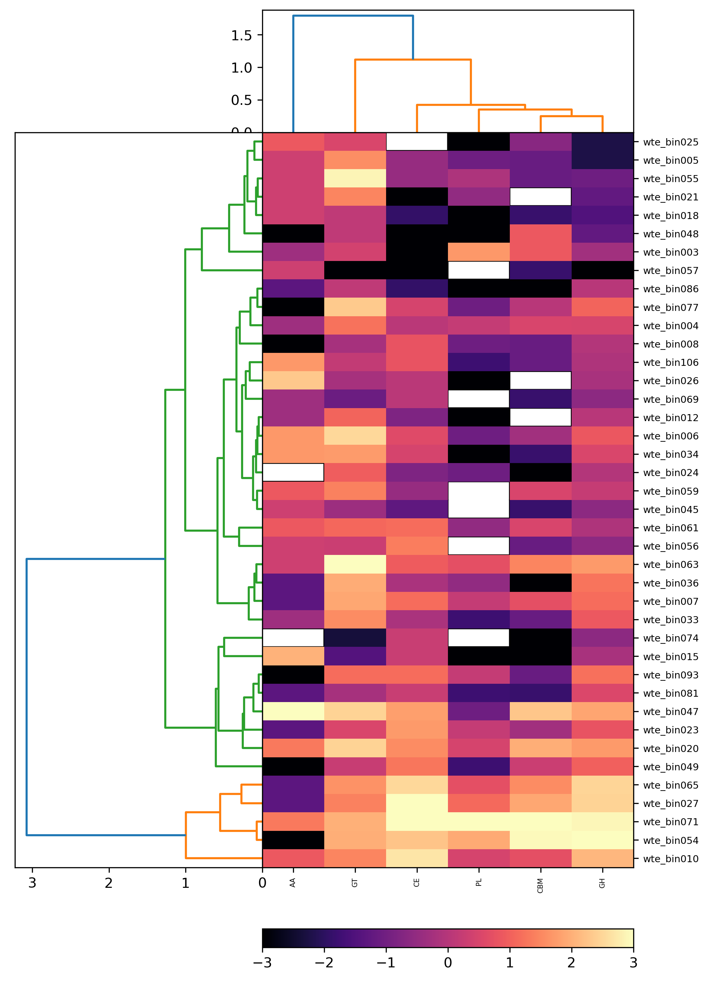

In [31]:
bi_cluster_heatmap_data (caz_arr, hq_bins, cazy_list, colormap = "magma",
                        cmin=-3, cmax=3, scaled_range=6)
                        #_plot_name = cazy_heatmap,

## Functional clustering of bins based on Kegg annotations

### Comparing genomes (MAGs) based on funtional content and identifying functional guilds

 - Developing normalization and distance/dissimilarity measures for comparing compositional data of microbiomes and performing statistical tests

### Normalize gene count based on observed and expected gene counts ( I.e. if all genes equally distributed)

- the observed counts for each gene
    - KO counts per MAG
- the expected frequencies if the null hypothesis were true (no difference between organisms)
    - KO counts per set of MAGs/total genes per set of MAGs * total genes per MAG
- Normalize all KO counts for each MAG
    - (oberved - expected) / expected


### Only use HQ MAGs - bins with > 80% completeness and < 20% contaminaion - for analysis

In [21]:
#------------------------------------------------------------------#
# Functions for working with KEGG and annotations
#------------------------------------------------------------------#
#
# self.assembly_dict[binID] = {'nodes':[],'lengths':[],'bin_length':0, \
#                              'mapped_counts':[],'rpkm':[],'genes':{}}
# self.assembly_dict[binID]['genes'][geneID]={\
#                           ['kegg'] = keggID
#                           ['COG']: [(cat,count),(cat,count)]
#                           ['mpileup']= [total_cov1, total_cov2,...total_covN]
#                           ['CAZy_funtion'] = functionID
#                           ['CAZyme'] = targetID
#                           [length_nt'] = length in bases (from gff file)
    
# self.all_kegg_counts[keggID] = [binID_1, binID_2,...,binID_n]
    
    
def sum_kegg_annotations_by_bin (self):
    # pull data from self.assembly_dict[binID]['genes'][geneID]['kegg'] = keggID
    # create a dictionary - binID = {K###1: count1,...K###N: countN} 
    self.kegg_counts_by_bin = {}
    for binID in self.assembly_dict:
        self.kegg_counts_by_bin[binID] = {}
        for geneID in self.assembly_dict[binID]['genes']:
            keggID = self.assembly_dict[binID]['genes'][geneID]['kegg']
            if keggID not in self.kegg_counts_by_bin[binID]:
                self.kegg_counts_by_bin[binID][keggID] = 1
            else:
                self.kegg_counts_by_bin[binID][keggID] += 1
    
def kegg_counts_to_dataset (self, bin_list = '', keggID_list='', file_name=''):
    # get a list of all Kegg Ids (K####'s)' from
    # self.kegg_counts_by_bin[binID][keggID] = count
    # generate numpy array of counts, index list of bin names, and column names list of Kegg IDs
        ## that can be used for creating a pandas dataframe
    # provide a list of bin ids to limit the analysis to a set of bins
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    if not keggID_list:
        keggID_list = self.keggID_list
    keggID_index = bin_list
    column_names = ["BinId"] + keggID_list
    keggID_data = []
    for binID in bin_list:
        bin_data = [binID]
        for keggID in keggID_list:
            if keggID in self.kegg_counts_by_bin[binID]:
                keggID_count = self.kegg_counts_by_bin[binID][keggID]
            else:
                keggID_count = 0
            bin_data.append(keggID_count)
        keggID_data.append(bin_data)
    keggID_df = pd.DataFrame(keggID_data, columns=column_names)
    if file_name:
        keggID_df.to_csv(file_name, sep="\t")
    display(keggID_df)
    unfiltered_keggID_data = [x[1:] for x in keggID_data]
    self.unfiltered_keggID_data = np.asarray(unfiltered_keggID_data) # the counts of annotated genes
    self.unfiltered_keggID_list = keggID_list # list of Kegg IDs, i.e. data column names
    self.unfiltered_keggID_binID_list = bin_list # bins in dataset, i.e. row names

def normalize_and_transform_kegg_counts_dataset (self):
    # use: (from function-kegg_counts_to_dataset)
        #self.unfiltered_keggID_data = np.asarray(keggID_data)
        #self.unfiltered_keggID_list = keggID_list
        #self.unfiltered_keggID_binID_list = bin_list
    #filter out zero sum columns
    zero_filtered_kegg_list = []
    columns_to_cut = []
    unfiltered_column_totals = np.sum(self.unfiltered_keggID_data, axis=0)
    for i in range(len(self.unfiltered_keggID_list)):
        if unfiltered_column_totals[i] > 0:
            zero_filtered_kegg_list.append(self.unfiltered_keggID_list[i])
        elif unfiltered_column_totals[i] == 0:  
            columns_to_cut.append(i)
    self.zero_filtered_keggID_list = zero_filtered_kegg_list #_the headers that passed the no zero test
    # still use  --> self.unfiltered_keggID_binID_list , i.e.the row names
    self.zero_filtered_keggID_data = np.delete(self.unfiltered_keggID_data, columns_to_cut,1)
    # normalize_kegg_counts
        # use observed gene frequency in a bin for each Kegg annotation
        # and expected gene frequency for a bin based on total gene  
        # frequency for the set of bins
    # sum each feature, i.e. column totals
    self.kegg_data_feature_sums = np.sum(self.zero_filtered_keggID_data, axis=0)
    # sum each row, i.e. bin totals
    self.kegg_data_row_sums = np.sum(self.zero_filtered_keggID_data, axis=1)
    # sum for all data
    self.kegg_data_total = np.sum(self.zero_filtered_keggID_data)
    # get expected K### frequency, column or feature total divided by total
    self.expected_by_feature = []
    
    for i in self.kegg_data_feature_sums:
        exp = i/self.kegg_data_total
        self.expected_by_feature.append(exp)
    # get observed K### frequency for each bin (row)
    self.observed_by_feature = [] 
    for i in range(len(self.zero_filtered_keggID_data)):
        observed_row = [Y/self.kegg_data_row_sums[i] for Y in self.zero_filtered_keggID_data[i]]
        self.observed_by_feature.append(observed_row)
    # get normalized data
    self.kegg_X = np.empty((len(self.zero_filtered_keggID_data),len(self.zero_filtered_keggID_data[1])), dtype=float)
    for i in range(len(self.observed_by_feature)):
        for j in range(len(self.observed_by_feature[i])):
            X_stat = (self.observed_by_feature[i][j] - self.expected_by_feature[j])/self.expected_by_feature[j]
            self.kegg_X[i][j] = X_stat
    
def kegg_X_df (self):
    #, index=["row1", "row2"], columns=["column1", "column2"])
    self.kegg_df = pd.DataFrame(data=self.kegg_X,index=self.unfiltered_keggID_binID_list,
                                columns=self.zero_filtered_keggID_list)
    self.kegg_df_summary = self.kegg_df.describe()
    # in notebook use:
        ## object.kegg_df.head()
        ## object.kegg_df.info()
        ## object.kegg_df_summary.head()
        
def cluster_bins_by_kegg_frequency (self, save_fig = ''):
    # run dendrogram without plotting and save as variable in order to access label position
    X_row_dist = scipy.spatial.distance.pdist(self.kegg_X, metric='correlation')
    row_linked_complete = linkage(X_row_dist, 'average')
    row_label_list = range(len(self.kegg_X))
    plt.figure(figsize=(15, 15))
    dendrogram(row_linked_complete,
        orientation='left',
        labels=self.unfiltered_keggID_binID_list,
        distance_sort='descending',
        show_leaf_counts=True)
    if save_fig:
        fig_file = save_fig
        plt.savefig(fig_file, dpi=300, format='svg')
    plt.show()
        
#
# Load Kegg ID descriptions
#
    
def load_kegg_db_from_text (self, kegg_text):
    # load descriptions for use with identified significant genes
        ## kegg_text = '/ko00001.keg
    self.keggDB_descriptions = {}
    self.keggDB_descriptions['na'] = "unassigned"
    with open(kegg_text) as inF:
        for line in inF:
            line = line.strip()
            if line[0] == 'D':
                lineList = line.split('  ')
                #print(lineList)
                kegg_id = lineList[3]
                description = lineList[4]
                #print(kegg_id +' : '+ description)
                if kegg_id not in self.keggDB_descriptions:
                    self.keggDB_descriptions[kegg_id] = description
    inF.close()

# Test for enrichment of genes in functional clusters
## Identify clusters based on previous normalization and clustering
## Use sets of bins for nonparametric test
### sample K###'s based on total gene counts 1000x
### compare observed counts to null (i.e. random) counts                             
                  
def non_parametric_tests (self, value, distribution, percentile_kind = 'rank'):
    dist_mean = np.mean(distribution)
    dist_stdv = np.std(distribution)
    dist_medn = np.median(distribution)
    dist_vars = ""
    dist_sder = ""
    dist_95ci = ""
    value_z = (value - dist_mean)/dist_stdv
    percentile = stats.percentileofscore(distribution, value, kind=percentile_kind)
    p_low = len([x for x in distribution if x <= value])/float(len(distribution))
    p_high = len([x for x in distribution if x >= value])/float(len(distribution))
    self.nonparametric_stats = (dist_mean, dist_stdv, dist_medn, percentile, value_z, p_low, p_high)
    
    
def test_cluster_functional_enrichment (self, cluster_name, cluster_list, p_value, n_samples=10000,
                                        replace=False, bin_list='', file_name=''):
    #self.keggDB_descriptions[keggID] = description
    #_All bin counts in: self.kegg_counts_by_bin[binID][keggID] = count
    #_ All Kegg IDs in: self.keggID_list
    print(f"Bins in cluster: {len(cluster_list)}")
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    #_get two arrays (1) all kegg ID counts & (2) cluster kegg ID counts 
    all_bins_counts_list = []
    cluster_bins_counts_list = []
    for binID in bin_list:
        bin_counts = []
        for keggID in self.keggID_list:
            if keggID in self.kegg_counts_by_bin[binID]:
                k_count = self.kegg_counts_by_bin[binID][keggID]
            else:
                k_count = 0
            bin_counts.append(k_count)
        all_bins_counts_list.append(bin_counts)
        if binID in cluster_list:
            cluster_bins_counts_list.append(bin_counts)
    all_kegg_counts = np.asarray(all_bins_counts_list)
    cluster_kegg_counts = np.asarray(cluster_bins_counts_list)
    
    #_get list of all kegg IDs (by index) to randomly sample from
    sum_each_feature = np.sum(all_kegg_counts, axis=0) #_the total counts for each column, i.e. keggID
    sum_all_features = np.sum(all_kegg_counts) #_the total counts for all data
    if replace == True:
        all_features_list = [x for x in range(len(self.keggID_list))] # [0]*sum_all_features
        all_features_probabilities = [y/sum_all_features for y in sum_each_feature]
    else:
        all_features_list = [0]*sum_all_features
        k = 0
        for i in range(len(sum_each_feature)):
            for j in range(sum_each_feature[i]):
                all_features_list[k] = i
                k += 1
    all_features_list = np.asarray(all_features_list)
    cluster_kegg_data = np.asarray(cluster_bins_counts_list)
    cluster_sum = np.sum(cluster_kegg_data) #_the total counts for all data
    cluster_feature_sums = np.sum(cluster_kegg_data, axis=0) #_the total counts for each column
    
    #_check each column in the feature counts matrix for zeros so that tests can only be performed
    #__on genes that are shared by all members of the cluster
    cluster_nonzeros = np.count_nonzero(cluster_kegg_data, axis=0,keepdims=False) 
    #_get n_samples (e.g. 1000) random samples equal to the cluster size from the total gene distribution
    test_samples = {}
    for i in range(len(self.keggID_list)):
        test_samples[i] = [0]*n_samples
    for m in range(n_samples):
        test_counts = [0]*len(self.keggID_list)
        if replace == True:
            test_kegg = np.random.choice(all_features_list, cluster_sum, replace=True, p=all_features_probabilities)
        else:
            test_kegg = np.random.choice(all_features_list, cluster_sum, replace=False)
        for n in test_kegg:
            test_counts[n] += 1
        for p in range(len(self.keggID_list)):
            test_samples[p][m] = test_counts[p]
    
    sig_kegg = []
    for q in range(len(self.keggID_list)):
        if cluster_nonzeros[q] == len(cluster_list): #check if each cluster member has a non-zero count
            keggID = self.keggID_list[q]
            test_value = cluster_feature_sums[q]
            test_distribution = test_samples[q]
            non_parametric_tests (self, test_value, test_distribution)
            dist_mean, dist_stdv, dist_medn, percentile, value_z, p_low, p_high = self.nonparametric_stats
            self.nonparametric_stats = ''
            if p_high <= p_value:
                sig_kegg.append([keggID,test_value,dist_mean,dist_stdv,percentile,value_z,p_high,
                                 self.keggDB_descriptions[keggID]])
                  
    print(f"\nsignificant K count: {len(sig_kegg)}")
    column_names = ['#KeggID','test_val','mean','std_dev','percentile','z','p_high','description']
    sig_keggID_df = pd.DataFrame(sig_kegg, columns=column_names)
    if file_name:
        sig_keggID_df.to_csv(file_name, sep="\t",index=False)
    display(sig_keggID_df)
    test_samples = {}
    
     

In [99]:
sum_kegg_annotations_by_bin(wte)

In [100]:
kegg_counts_to_dataset (wte, bin_list=hq_bins, keggID_list='', file_name='')

,BinId,K01955,K01956,K23753,K03299,K02004,K02003,K01711,K02377,K09690,...,K19173,K07143,K11604,K09874,K02777,K23086,K09964,K16163,K02525,K13874
0,wte_bin003,1,1,1,1,7,6,2,1,3,...,0,0,0,0,0,0,0,0,0,0
1,wte_bin004,0,0,0,0,3,2,1,0,2,...,0,0,0,0,0,0,0,0,0,0
2,wte_bin005,1,1,0,0,11,11,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,wte_bin006,5,1,0,0,8,6,1,1,4,...,0,0,0,0,0,0,0,0,0,0
4,wte_bin007,1,1,0,0,7,4,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,wte_bin008,0,0,0,1,3,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,wte_bin010,1,1,0,0,7,3,2,1,1,...,0,0,0,0,0,0,0,0,0,0
7,wte_bin012,2,2,0,0,5,5,3,1,0,...,0,0,0,0,0,0,0,0,0,0
8,wte_bin015,1,1,0,0,7,6,0,0,2,...,0,0,0,0,0,0,0,0,0,0
9,wte_bin018,1,1,0,0,4,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [101]:
normalize_and_transform_kegg_counts_dataset(wte)

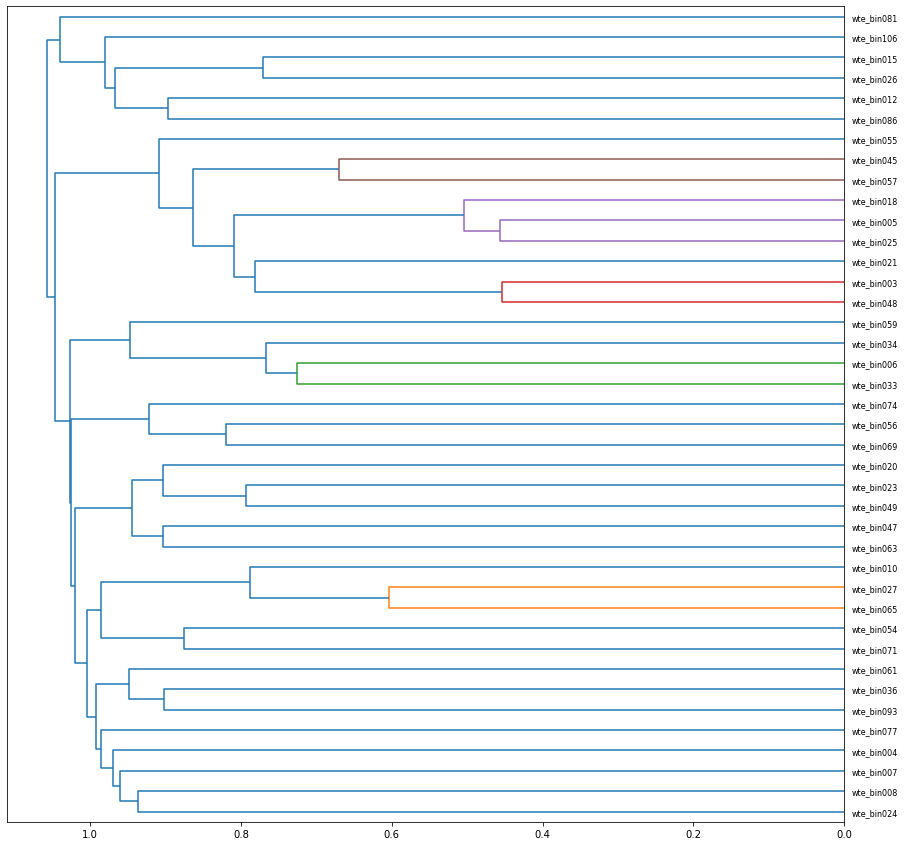

In [102]:
cluster_bins_by_kegg_frequency(wte, save_fig = '')

## Identified clusters of hqMAGs can be tested for functional enrichment

- Make lists for each cluster - e.g. cluster1_list = \[bin1,...bin2\]

- Nonparametric test based on comparing observed distribution to random distribution based on 1000x sampling

### Load Kegg annotation descriptions

In [50]:
kegg_text = './data/ko00001.keg'

In [52]:
load_kegg_db_from_text(wte, kegg_text)

### Define clusters

In [53]:
# beta-(4) , & gamma-(1) proteobacteria
cluster1 = ['wte_bin012','wte_bin015','wte_bin026', 'wte_bin086','wte_bin106']

# methanogens
cluster2 = ['wte_bin003','wte_bin005','wte_bin018','wte_bin021','wte_bin025','wte_bin045',
            'wte_bin048','wte_bin055','wte_bin057']

# deltaproteobacteria
cluster3 = ['wte_bin059','wte_bin034','wte_bin006','wte_bin033']

# clostridia
cluster4 = ['wte_bin056','wte_bin069','wte_bin074']

# anaerolineae
cluster5 = ['wte_bin047','wte_bin049','wte_bin020','wte_bin023','wte_bin063']

# bacteroidia (3), phycisphaerae (1), and planctomycetia (1)
cluster6 = ['wte_bin010','wte_bin027', 'wte_bin065','wte_bin054','wte_bin071']

# flavobacteria, ignavibacteia(2), 
cluster7 = ['wte_bin061','wte_bin036','wte_bin093']

# alpha-(1) 'wte_bin081'

#FCPU426, OP8, krumholzibacteria, WOR-3, and Fermentibacteria
cluster8 = ['wte_bin004','wte_bin008','wte_bin024','wte_bin007','wte_bin077']

### Test each cluster

In [106]:
#_test_cluster_functional_enrichment (self, cluster_name, cluster_list, p_value, n_samples=10000,
#                                        replace=False, bin_list='', file_name=''):

In [123]:
test_cluster_functional_enrichment(wte, 'cluster1', cluster1, 0.001, n_samples=10000,
                                   file_name='./data/cluster1.txt')

Bins in cluster: 5

significant K count: 58


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K03832,18,6.7975,2.543756,99.990,4.403921,0.0001,tonB; periplasmic protein TonB
1,K02014,37,12.6787,3.467401,100.000,7.014275,0.0000,TC.FEV.OM; iron complex outermembrane recepter...
2,K03561,17,6.6781,2.537574,99.975,4.067626,0.0005,exbB; biopolymer transport protein ExbB
3,K00797,14,4.3009,2.035868,99.985,4.764110,0.0003,"speE, SRM, SPE3; spermidine synthase [EC:2.5.1..."
4,K03634,7,1.3796,1.147129,99.990,4.899538,0.0003,lolA; outer membrane lipoprotein carrier protein
5,K00406,9,1.9939,1.376540,100.000,5.089644,0.0001,ccoP; cytochrome c oxidase cbb3-type subunit III
6,K14260,8,1.9419,1.360560,99.955,4.452651,0.0007,alaA; alanine-synthesizing transaminase [EC:2....
7,K07735,7,1.7716,1.306152,99.955,4.002903,0.0009,algH; putative transcriptional regulator
8,K03772,11,1.8911,1.344188,100.000,6.776509,0.0000,fkpA; FKBP-type peptidyl-prolyl cis-trans isom...
9,K07689,10,2.4819,1.525606,100.000,4.927945,0.0001,"uvrY, gacA, varA; two-component system, NarL f..."


In [114]:
test_cluster_functional_enrichment(wte, 'cluster2', cluster2, 0.001, n_samples=10000,
                                  file_name='./data/cluster2.txt')

Bins in cluster: 9

significant K count: 151


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K01912,32,16.9415,3.974076,99.975,3.789183,0.0004,paaK; phenylacetate-CoA ligase [EC:6.2.1.30]
1,K08094,15,2.0856,1.402167,100.000,9.210314,0.0000,hxlB; 6-phospho-3-hexuloisomerase [EC:5.3.1.27]
2,K03263,10,1.0593,1.004681,100.000,8.899045,0.0000,EIF5A; translation initiation factor 5A
3,K03151,11,2.1530,1.430102,100.000,6.186273,0.0000,thiI; tRNA uracil 4-sulfurtransferase [EC:2.8....
4,K03547,16,5.3862,2.264034,100.000,4.688004,0.0000,"sbcD, mre11; DNA repair protein SbcD/Mre11"
...,...,...,...,...,...,...,...,...
146,K06943,9,1.2873,1.104065,100.000,6.985732,0.0000,NOG1; nucleolar GTP-binding protein
147,K04799,9,1.2801,1.092723,100.000,7.064827,0.0000,"FEN1, RAD2; flap endonuclease-1 [EC:3.-.-.-]"
148,K01974,9,2.0942,1.405107,100.000,4.914785,0.0000,"RTCA, rtcA; RNA 3'-terminal phosphate cyclase ..."
149,K07060,9,1.0623,0.995901,100.000,7.970371,0.0000,nob1; endoribonuclease Nob1 [EC:3.1.-.-]


In [116]:
test_cluster_functional_enrichment(wte, 'cluster3', cluster3, 0.001, n_samples=10000,
                                  file_name='./data/cluster3.txt')

Bins in cluster: 4

significant K count: 53


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K01912,29,13.6026,3.641136,99.985,4.228735,0.0003,paaK; phenylacetate-CoA ligase [EC:6.2.1.30]
1,K07315,27,13.5484,3.611850,99.960,3.724297,0.0005,rsbU_P; phosphoserine phosphatase RsbU/P [EC:3...
2,K03388,57,12.3299,3.431948,100.000,13.015961,0.0000,hdrA2; heterodisulfide reductase subunit A2 [E...
3,K14127,28,6.1241,2.383548,100.000,9.177874,0.0000,"mvhD, vhuD, vhcD; F420-non-reducing hydrogenas..."
4,K07090,28,12.0076,3.419553,100.000,4.676752,0.0000,K07090; uncharacterized protein
5,K06897,15,5.7214,2.335847,99.945,3.972263,0.0008,"K06897; 7,8-dihydropterin-6-yl-methyl-4-(beta-..."
6,K11261,14,3.1709,1.725136,100.000,6.277245,0.0000,"fwdE, fmdE; formylmethanofuran dehydrogenase s..."
7,K01007,16,6.0153,2.370499,99.965,4.212067,0.0005,"pps, ppsA; pyruvate, water dikinase [EC:2.7.9.2]"
8,K01995,39,15.2457,3.816770,100.000,6.223666,0.0000,livG; branched-chain amino acid transport syst...
9,K01996,39,14.9398,3.772211,100.000,6.378275,0.0000,livF; branched-chain amino acid transport syst...


In [117]:
test_cluster_functional_enrichment(wte, 'cluster4', cluster4, 0.001, n_samples=10000,
                                  file_name='./data/cluster4.txt')

Bins in cluster: 3

significant K count: 27


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K16786,6,0.6568,0.796250,100.000,6.710457,0.0000,ecfA1; energy-coupling factor transport system...
1,K25232,13,3.9672,1.969702,100.000,4.585872,0.0000,fakB; fatty acid kinase fatty acid binding sub...
2,K00174,14,4.4895,2.073039,99.990,4.587710,0.0001,"korA, oorA, oforA; 2-oxoglutarate/2-oxoacid fe..."
3,K00077,12,2.9731,1.704458,100.000,5.296054,0.0000,"panE, apbA; 2-dehydropantoate 2-reductase [EC:..."
4,K03320,12,3.6982,1.880616,100.000,4.414405,0.0001,"amt, AMT, MEP; ammonium transporter, Amt family"
5,K08303,11,2.3480,1.519176,100.000,5.695192,0.0000,"prtC, trhP; U32 family peptidase [EC:3.4.-.-]"
6,K18332,8,1.4780,1.196460,100.000,5.451082,0.0000,hndD; NADP-reducing hydrogenase subunit HndD [...
7,K00176,11,1.7788,1.309760,100.000,7.040375,0.0000,"korD, oorD; 2-oxoglutarate ferredoxin oxidored..."
8,K00177,11,1.8905,1.344734,100.000,6.774202,0.0000,"korC, oorC; 2-oxoglutarate ferredoxin oxidored..."
9,K09118,6,0.6128,0.765948,100.000,7.033377,0.0000,K09118; uncharacterized protein


In [118]:
test_cluster_functional_enrichment(wte, 'cluster5', cluster5, 0.001, n_samples=10000,
                                  file_name='./data/cluster5.txt')

Bins in cluster: 5

significant K count: 43


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K07335,22,7.1667,2.598444,100.000,5.708532,0.0000,"bmpA, bmpB, tmpC; basic membrane protein A and..."
1,K12132,78,45.2843,6.553081,100.000,4.992415,0.0000,"prkC, stkP; eukaryotic-like serine/threonine-p..."
2,K02945,18,7.3063,2.613442,99.990,4.091807,0.0003,"RP-S1, rpsA; small subunit ribosomal protein S1"
3,K03466,26,9.2939,2.987561,100.000,5.591885,0.0000,"ftsK, spoIIIE; DNA segregation ATPase FtsK/Spo..."
4,K02035,47,27.5796,5.010376,99.990,3.876037,0.0001,ABC.PE.S; peptide/nickel transport system subs...
5,K00627,19,6.9305,2.576135,100.000,4.685120,0.0000,"DLAT, aceF, pdhC; pyruvate dehydrogenase E2 co..."
6,K07658,19,5.5549,2.293902,100.000,5.861236,0.0000,"phoB1, phoP; two-component system, OmpR family..."
7,K11693,7,1.3995,1.155379,99.985,4.847329,0.0004,"femX, fmhB; peptidoglycan pentaglycine glycine..."
8,K12960,22,7.2260,2.635284,100.000,5.606226,0.0000,mtaD; 5-methylthioadenosine/S-adenosylhomocyst...
9,K10914,22,10.2091,3.155880,99.975,3.736169,0.0005,"crp; CRP/FNR family transcriptional regulator,..."


In [120]:
test_cluster_functional_enrichment(wte, 'cluster6', cluster6, 0.001, n_samples=10000,
                                  file_name='./data/cluster6.txt')

Bins in cluster: 5

significant K count: 45


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K02004,75,42.0629,6.356064,100.000,5.181997,0.0000,ABC.CD.P; putative ABC transport system permea...
1,K12308,12,3.7368,1.859442,100.000,4.443913,0.0001,"bgaB, lacA; beta-galactosidase [EC:3.2.1.23]"
2,K07636,21,9.7046,3.012696,99.965,3.749266,0.0007,"phoR; two-component system, OmpR family, phosp..."
3,K03797,19,7.8632,2.756245,99.990,4.040570,0.0003,"E3.4.21.102, prc, ctpA; carboxyl-terminal proc..."
4,K03294,19,5.2201,2.221183,100.000,6.203855,0.0001,"TC.APA; basic amino acid/polyamine antiporter,..."
5,K19294,16,6.2407,2.454743,99.975,3.975691,0.0004,algI; alginate O-acetyltransferase complex pro...
6,K00325,13,2.1762,1.436507,100.000,7.534803,0.0000,pntB; H+-translocating NAD(P) transhydrogenase...
7,K00324,17,3.6740,1.875186,100.000,7.106494,0.0000,pntA; H+-translocating NAD(P) transhydrogenase...
8,K04771,29,12.0537,3.373902,100.000,5.022760,0.0000,"degP, htrA; serine protease Do [EC:3.4.21.107]"
9,K01206,35,6.0761,2.379435,100.000,12.155787,0.0000,FUCA; alpha-L-fucosidase [EC:3.2.1.51]


In [121]:
test_cluster_functional_enrichment(wte, 'cluster7', cluster7, 0.001, n_samples=10000,
                                  file_name='./data/cluster7.txt')

Bins in cluster: 3

significant K count: 17


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K03783,7,1.3020,1.130042,99.985,5.042288,0.0004,"punA, PNP; purine-nucleoside phosphorylase [EC..."
1,K07114,17,6.6050,2.533767,99.990,4.102587,0.0003,yfbK; Ca-activated chloride channel homolog
2,K07263,16,4.7738,2.138933,100.000,5.248505,0.0000,pqqL; zinc protease [EC:3.4.24.-]
3,K06142,6,0.8824,0.923889,99.970,5.539196,0.0004,"hlpA, ompH; outer membrane protein"
4,K03585,10,3.0126,1.725932,99.950,4.048479,0.0009,"acrA, mexA, adeI, smeD, mtrC, cmeA; membrane f..."
5,K03771,7,1.1100,1.049810,100.000,5.610542,0.0000,surA; peptidyl-prolyl cis-trans isomerase SurA...
6,K03305,6,0.9633,0.962784,99.980,5.231391,0.0004,TC.POT; proton-dependent oligopeptide transpor...
7,K18989,3,0.1187,0.338246,100.000,8.518358,0.0001,vexF; multidrug efflux pump
8,K16087,5,0.7873,0.867444,99.940,4.856453,0.0010,"TC.FEV.OM3, tbpA, hemR, lbpA, hpuB, bhuR, hugA..."
9,K15862,3,0.1260,0.352028,100.000,8.164114,0.0001,ccoNO; cytochrome c oxidase cbb3-type subunit ...


In [122]:
test_cluster_functional_enrichment(wte, 'cluster8', cluster8, 0.001, n_samples=10000,
                                  file_name='./data/cluster8.txt')

Bins in cluster: 5

significant K count: 11


,#KeggID,test_val,mean,std_dev,percentile,z,p_high,description
0,K07027,18,7.3307,2.670793,99.975,3.994805,0.0006,K07027; glycosyltransferase 2 family protein
1,K07164,8,1.9063,1.364742,99.975,4.465094,0.0005,K07164; uncharacterized protein
2,K07114,24,10.4301,3.171169,100.000,4.279147,0.0000,yfbK; Ca-activated chloride channel homolog
3,K04771,19,8.3542,2.820486,99.980,3.774456,0.0004,"degP, htrA; serine protease Do [EC:3.4.21.107]"
4,K07263,19,7.6310,2.688948,99.990,4.228048,0.0002,pqqL; zinc protease [EC:3.4.24.-]
5,K07277,11,3.1126,1.745830,99.965,4.517852,0.0007,"SAM50, TOB55, bamA; outer membrane protein ins..."
6,K03585,14,4.8372,2.162521,99.985,4.237092,0.0003,"acrA, mexA, adeI, smeD, mtrC, cmeA; membrane f..."
7,K03561,17,4.3912,2.068565,100.000,6.095432,0.0000,exbB; biopolymer transport protein ExbB
8,K03286,12,3.8481,1.947826,99.960,4.185127,0.0006,"TC.OOP; OmpA-OmpF porin, OOP family"
9,K02806,10,2.4072,1.520720,100.000,4.992899,0.0001,ptsN; nitrogen PTS system EIIA component [EC:2...


# Now turn analysis to comparisons with other metagenomes (i.e. sequencing libraries) that can be downloaded from public repositories like NCBI

## Comparing genomes based on biogeographic distributions

### Map reads from publically available genomes
- Which populatins have metagenome coverage across different environments?
- Do functional guilds have correlated abundance patterns?


### Generate alignment (sam) files that list all reads mapped to each sequence (i.e. contig or scaffold) from a set of downloaded metagenomes (e.g. SRA files downloaded from NCBI)
- aligning read libraries against the assembled sequences -> sam file
    
- **bowtie2** was run with the following options:
 - create the database:
    
 - align the reads:
 
    $ bowtie2 -x ./data/hybridassembly_bt2_db/wte_hybrid -U ### --no-unal --no-head --no-sq -p 12 -S ###.sam$

### Get a list of sam files to process using the same functions that were used to compare bin/taxa abundances earlier

In [26]:
sra_file_directory = './data/metagenome_comparisons/'

In [27]:
sra_file_extension = '.lcl.sam'

In [28]:
sra_name_list = ['SRR16526853','SRR16472569','SRR16472567',
                 'SRR15239588','SRR15239545','SRR15239542',
                 'SRR15021097','SRR12681659','SRR12681651',
                 'SRR12681650','SRR8925731','SRR8925713',
                 'SRR8881341','SRR8881009','SRR8879137',
                 'SRR8879134','SRR8449815','SRR8449814',
                 'SRR8426597','SRR8426594','SRR8165485',
                 'SRR8165484','SRR8165483','SRR8165481',
                 'SRR7268657','SRR6181324','SRR6179360',
                 'SRR4072256','SRR4072255','SRR4072253',
                 'ERR6196083']

In [29]:
sra_file_list = [sra_file_directory + x + sra_file_extension for x in sra_name_list]

In [51]:
get_mapped_read_counts_for_bins_from_sam(wte, sra_file_list, sra_name_list)

FloatProgress(value=0.0, max=31.0)

,SAM file,mapped reads
0,SRR16526853,446779
1,SRR16472569,1690858
2,SRR16472567,1654996
3,SRR15239588,319898
4,SRR15239545,337524
5,SRR15239542,451742
6,SRR15021097,711147
7,SRR12681659,1566477
8,SRR12681651,977095
9,SRR12681650,1417160


In [52]:
calc_bin_rpkm_stats(wte)

In [53]:
print_bin_rpkm_data(wte, bin_list = hq_bins, sam_list = '', file_name = '')

,BinId,A,B,C,SRR16526853,SRR16472569,SRR16472567,SRR15239588,SRR15239545,SRR15239542,...,SRR8165484,SRR8165483,SRR8165481,SRR7268657,SRR6181324,SRR6179360,SRR4072256,SRR4072255,SRR4072253,ERR6196083
0,wte_bin003,16.148900,16.867479,23.861399,0.000704,0.098360,0.054900,0.327268,0.394941,0.192083,...,0.696732,0.645527,0.008619,0.521431,0.417461,0.935987,2.055262,0.733705,0.299711,0.120406
1,wte_bin004,15.385300,7.659159,14.456037,2.462679,2.750187,2.058987,0.421016,0.382129,0.319886,...,1.653355,1.670907,0.483266,0.486816,3.671720,2.818673,2.250243,2.586395,2.140814,2.162444
2,wte_bin005,15.097984,18.458858,16.392862,0.000000,0.122841,0.166069,1.180526,1.442996,1.033698,...,1.062659,2.351314,0.010072,0.147703,0.847707,1.624002,0.195453,0.084039,0.065846,0.459923
3,wte_bin006,13.808231,11.338469,12.984294,0.131285,0.289580,0.225312,1.715725,2.573799,2.206392,...,0.684642,4.051591,0.034704,0.074577,0.478637,0.506905,1.646555,0.581893,0.481738,1.914390
4,wte_bin007,9.154069,2.906648,5.647952,3.187485,3.052723,1.803822,0.337110,0.308026,0.274459,...,0.839879,4.466409,0.429044,0.424855,3.130490,3.343921,2.717261,2.682537,2.449730,2.385375
5,wte_bin008,7.127166,2.863929,5.321828,0.852013,0.339807,0.318714,0.067011,0.076021,0.056800,...,0.144496,0.116169,0.082001,0.129980,1.494687,1.422818,0.499442,0.418924,0.401372,0.671541
6,wte_bin010,6.451990,7.757152,6.702997,3.395924,0.699706,0.749209,58.589998,54.035837,40.079182,...,1.596606,17.871801,3.170849,0.463351,3.492870,4.884033,2.957546,2.132715,1.854703,63.746816
7,wte_bin012,5.914711,0.614117,5.916482,0.957437,6.500200,5.118945,1.011692,0.760413,0.907154,...,0.402559,0.121956,1.392611,1.763977,1.036002,1.776566,2.576139,7.887962,6.903662,0.744907
8,wte_bin015,5.211385,4.264783,3.771226,0.464983,2.614461,1.924728,1.920372,0.967746,1.544749,...,0.171763,0.088535,1.441762,0.450366,0.471516,0.496635,5.103625,3.811948,3.871224,0.449631
9,wte_bin018,4.350757,7.324302,6.433808,0.000000,0.037837,0.067238,2.249902,2.641565,1.498335,...,0.804403,5.343739,0.013542,0.039323,0.477504,7.953519,0.227396,0.111566,0.072091,4.315821


In [24]:
bin_sra_covs = './data/bin_sra_covs.txt'

In [25]:
load_rpkm_from_file(wte, bin_sra_covs)

	<> loading bin rpkm data from: ./data/bin_sra_covs.txt


In [26]:
wte.sam_files_names

['SRR16526853',
 'SRR16472569',
 'SRR16472567',
 'SRR15239588',
 'SRR15239545',
 'SRR15239542',
 'SRR15021097',
 'SRR12681659',
 'SRR12681651',
 'SRR12681650',
 'SRR8925731',
 'SRR8925713',
 'SRR8881341',
 'SRR8881009',
 'SRR8879137',
 'SRR8879134',
 'SRR8449815',
 'SRR8449814',
 'SRR8426597',
 'SRR8426594',
 'SRR8165485',
 'SRR8165484',
 'SRR8165483',
 'SRR8165481',
 'SRR7268657',
 'SRR6181324',
 'SRR6179360',
 'SRR4072256',
 'SRR4072255',
 'SRR4072253',
 'ERR6196083']

In [27]:
print_bin_rpkm_data(wte, bin_list =hq_bins, sam_list = '', file_name = '')

,BinId,SRR16526853,SRR16472569,SRR16472567,SRR15239588,SRR15239545,SRR15239542,SRR15021097,SRR12681659,SRR12681651,...,SRR8165484,SRR8165483,SRR8165481,SRR7268657,SRR6181324,SRR6179360,SRR4072256,SRR4072255,SRR4072253,ERR6196083
0,wte_bin003,0.000704,0.098360,0.054900,0.327268,0.394941,0.192083,0.077366,0.243248,0.315970,...,0.696732,0.645527,0.008619,0.521431,0.417461,0.935987,2.055262,0.733705,0.299711,0.120406
1,wte_bin004,2.462679,2.750187,2.058987,0.421016,0.382129,0.319886,1.546290,4.423703,4.187395,...,1.653355,1.670907,0.483266,0.486816,3.671720,2.818673,2.250243,2.586395,2.140814,2.162444
2,wte_bin005,0.000000,0.122841,0.166069,1.180526,1.442996,1.033698,0.038353,0.610547,0.563800,...,1.062659,2.351314,0.010072,0.147703,0.847707,1.624002,0.195453,0.084039,0.065846,0.459923
3,wte_bin006,0.131285,0.289580,0.225312,1.715725,2.573799,2.206392,0.317855,0.454987,0.485138,...,0.684642,4.051591,0.034704,0.074577,0.478637,0.506905,1.646555,0.581893,0.481738,1.914390
4,wte_bin007,3.187485,3.052723,1.803822,0.337110,0.308026,0.274459,1.733155,3.243036,3.207965,...,0.839879,4.466409,0.429044,0.424855,3.130490,3.343921,2.717261,2.682537,2.449730,2.385375
5,wte_bin008,0.852013,0.339807,0.318714,0.067011,0.076021,0.056800,0.216486,0.829369,0.786151,...,0.144496,0.116169,0.082001,0.129980,1.494687,1.422818,0.499442,0.418924,0.401372,0.671541
6,wte_bin010,3.395924,0.699706,0.749209,58.589998,54.035837,40.079182,0.993049,3.922826,4.068059,...,1.596606,17.871801,3.170849,0.463351,3.492870,4.884033,2.957546,2.132715,1.854703,63.746816
7,wte_bin012,0.957437,6.500200,5.118945,1.011692,0.760413,0.907154,13.603139,1.899850,1.982053,...,0.402559,0.121956,1.392611,1.763977,1.036002,1.776566,2.576139,7.887962,6.903662,0.744907
8,wte_bin015,0.464983,2.614461,1.924728,1.920372,0.967746,1.544749,4.727716,1.068103,1.052650,...,0.171763,0.088535,1.441762,0.450366,0.471516,0.496635,5.103625,3.811948,3.871224,0.449631
9,wte_bin018,0.000000,0.037837,0.067238,2.249902,2.641565,1.498335,0.115325,0.235489,0.229168,...,0.804403,5.343739,0.013542,0.039323,0.477504,7.953519,0.227396,0.111566,0.072091,4.315821


## Visualize clustered RPKM data
1. Bi-cluster data by correlation of rpkm values
    - scipy.spatial.distance.pdist()
    - scipy.cluster.hierarchy.linkage()
2. Heatmap using transformed RPKM data
    - Log10 transform all RPKM values
        - zeros become 'NaN'
    - Normalize each sample (i.e. each column by column mean and column standard deviation)
        - (value - mean) / std.dev
    - Scale data on range (e.g. -2 to 2)
        - Get scalar value by dividing new scaled range (e.g. 4) by each column's range (max - min)
        - Find midrange value (range / 2  + min)
        - Scale: (value - midrange) * scalar

In [34]:
rpkm_data = rpkm_to_array (wte, bin_list=hq_bins, sam_list='')

/tmp/ipykernel_32379/3743127127.py:7: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  v_linkage_array = scipy.cluster.hierarchy.linkage(v_distance_array, method='average')
/tmp/ipykernel_32379/3743127127.py:13: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  h_linkage_array = scipy.cluster.hierarchy.linkage(h_distance_array, method='average')


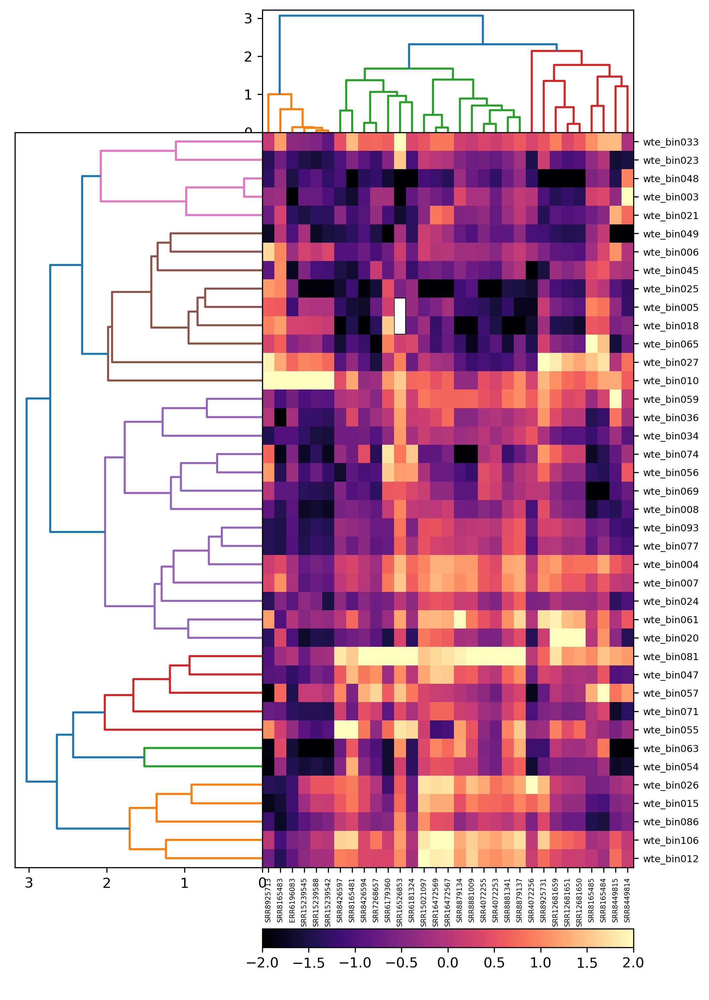

In [35]:
bi_cluster_heatmap_data (rpkm_data, hq_bins, wte.sam_files_names, colormap = "magma", plot_name = "",
                        cmin=-2, cmax=2, scaled_range=4)

# What information can be learned from read mapping to individual genes? I.e. how does gene specific coverage within each bin compare across metagenomes and what information does that convey about selective pressures or conserved functions?
- Compare coverage of individual genes within bins across sequence libraries
- Are some genes more conserved than others among closely related populations/organisms?
- Are conserved genes functionally relavent to functional guilds?

## Identifying conserved genes/proteins

### Use mpileup format to get position specific coverage for alignments against gene calls in the assembly
- Which genes are conserved across different environments?


    $ bowtie2 --very-fast-local -x ./data/assembly_bt2_db -U OOOOO.fastq --no-unal -p 12 | samtools view -bS | samtools sort -@ 12 -o OOOOO.lcl.sorted.bam


    $ allFQs=('SRR12681650' 'SRR12681651' 'SRR12681659' 'SRR15021097' 'SRR15239542' 'SRR15239545' 'SRR15239588' 'SRR16472567' 'SRR16472569' 'SRR16526853' 'SRR4072253' 'SRR4072255' 'SRR4072256' 'SRR7268657' 'SRR8165481' 'SRR8165483' 'SRR8165484' 'SRR8165485' 'SRR8426594' 'SRR8426597' 'SRR8449814' 'SRR8449815' 'SRR8879134' 'SRR8879137' 'SRR8881009' 'SRR8881341' 'SRR8925713' 'SRR8925731')


    $ for f in ${allFQs[@]}; do
       bowtie2 --very-fast-local -x .data/assembly_bt2_db -U ${f}.fastq --no-unal -p 12 | samtools view -bS | samtools sort -@ 12 -o ${f}.lcl.sorted.bam
    done

### Columns :
1. Chromosome name.
2. 1-based position on the chromosome.
3. Reference base at this position
4. Number of reads covering this position.
5. Read bases. This encodes information on matches, mismatches, indels, strand, mapping quality, and starts and ends of reads.
    - For each read covering the position, this column contains:
        - If this is the first position covered by the read, a “^” character followed by the alignment's mapping quality encoded as an ASCII character.
        - A single character indicating the read base and the strand to which the read has been mapped:
        - Forward|. dot - Base matches the reference base
        - Reverse|, comma - Base matches the reference base
        - Forward|ACGTN - Base is a mismatch to the reference base
        - Reverse|acgtn - Base is a mismatch to the reference base
        - \>	<|Reference skip (due to CIGAR “N”)
        - *	*/#|Deletion of the reference base (CIGAR “D”)
        - Deleted bases are shown as “*” on both strands unless --reverse-del is used, in which case they are shown as “#” on the reverse strand.

        - If there is an insertion after this read base, text matching “\\+[0-9]+[ACGTNacgtn*#]+”: a “+” character followed by an integer giving the length of the insertion and then the inserted sequence. Pads are shown as “*” unless --reverse-del is used, in which case pads on the reverse strand will be shown as “#”.
        - If there is a deletion after this read base, text matching “-[0-9]+[ACGTNacgtn]+”: a “-” character followed by the deleted reference bases represented similarly. (Subsequent pileup lines will contain “*” for this read indicating the deleted bases.)
        - If this is the last position covered by the read, a “$” character.
        
6. Base qualities, encoded as ASCII characters.



    
    wte_bin003|NODE_1	2119	G	0	*	*
    wte_bin003|NODE_1	2120	A	1	,	E
    wte_bin003|NODE_1	2121	A	1	,	C
    wte_bin003|NODE_1	2122	G	1	,	D
    wte_bin003|NODE_1	2123	T	1	,	=
    wte_bin003|NODE_1	2124	C	1	,	E
    wte_bin003|NODE_1	2125	G	1	,	E
    wte_bin003|NODE_1	2126	T	1	a	D
    wte_bin003|NODE_1	2127	A	1	c	E
    wte_bin003|NODE_1	2128	G	1	,	D


In [28]:
sra_file_directory = '.data/metagenome_comparisons/'
mpileup_file_extension = '.lcl.sorted.mpileup'

In [29]:
sra_name_list = ['SRR16526853','SRR16472569','SRR16472567',
                 'SRR15239588','SRR15239545','SRR15239542',
                 'SRR15021097','SRR12681659','SRR12681651',
                 'SRR12681650','SRR8925731','SRR8925713',
                 'SRR8881341','SRR8881009','SRR8879137',
                 'SRR8879134','SRR8449815','SRR8449814',
                 'SRR8426597','SRR8426594','SRR8165485',
                 'SRR8165484','SRR8165483','SRR8165481',
                 'SRR7268657','SRR6181324','SRR6179360',
                 'SRR4072256','SRR4072255','SRR4072253',
                 'ERR6196083']

In [30]:
mpileup_file_list = [sra_file_directory + x + mpileup_file_extension for x in sra_name_list]

In [31]:
#------------------------------------------------------------------#
# Functions for working with mpileup files
#   bowtie2 alignment -> sorted bam -> mpileup
#------------------------------------------------------------------#
#
# self.assembly_dict[binID] = {'nodes':[],'lengths':[],'bin_length':0, \
#                              'mapped_counts':[],'rpkm':[],'genes':{}}
# self.assembly_dict[binID]['genes'][geneID]={\
#                           ['COG']: [(cat,count),(cat,count)]
#                           ['kegg']: 'keggID'
#                           ['CAZy_funtion'] = functionID
#                           ['CAZyme'] = targetID
#                           [length_nt'] = length in bases (from gff file)
####**Function adds to ->   ['mpileup']= [total_cov1, total_cov2,...total_covN]
#
# self.node_gff[nodeID]['starts']=[gene_start,....,...]
# self.node_gff[nodeID]['stops']=[gene_stop,....,...]
# self.node_gff[nodeID]['geneID']=[geneID,....,...]
#
#
# self.mpileup_files_list = [] #_list of mpileup file paths for gene coverage based analyses
# self.mpileup_files_names = [] #_list of simple names for sam files

def get_per_base_coverage_for_genes_from_mpileup (self, mpileup_files, mpileup_file_names,
                                                  bin_list='', file_name=''):#, data_norm='mapped'):
    #_normalize data_norm= 'length':gene length or (default)'mapped':bases with coverage
    #print(f"<> Counting mapped bases in:")
    if type(mpileup_files) != list:
        mpileup_files = [mpileup_files]
    if type(mpileup_file_names) != list:
        mpileup_file_names = [mpileup_file_names]
    # Progress Bar #
    fp = FloatProgress(min=0, max=len(mpileup_files))
    display(fp)
    progress = 0
    for (mpileup_file, mpileup_file_name) in zip(mpileup_files, mpileup_file_names): 
        fp.value = progress
        progress += 1
        #print(f"\t\t{mpileup_file_name}")
        ### Add check if file already processed ###
        self.mpileup_files_list.append(mpileup_file)
        self.mpileup_files_names.append(mpileup_file_name)
        mpileup_index = len(self.mpileup_files_list) - 1
        self.mpileup_sums.append(0)
        this_mpileup_sum = 0
        #if not bin_list:
            #bin_list = self.assembly_dict.keys()
        for binID in self.assembly_dict:
            for geneID in self.assembly_dict[binID]['genes']:
                if 'mpileup' not in self.assembly_dict[binID]['genes'][geneID]:
                    self.assembly_dict[binID]['genes'][geneID]['mpileup'] = [0.0]
                else:
                    self.assembly_dict[binID]['genes'][geneID]['mpileup'].append(0.0)
        gene_coverages = {}
        with open(mpileup_file) as inF:
            for line in inF:
                line_list = line.strip().split('\t')
                position = int(line_list[1])
                coverage = int(line_list[3])
                binID = line_list[0].split('|')[0]
                nodeID = line_list[0]
                this_mpileup_sum += coverage
                if nodeID in self.node_gff:
                    for i in range(len(self.node_gff[nodeID]['starts'])):
                        if position >= self.node_gff[nodeID]['starts'][i]:
                            if position <= self.node_gff[nodeID]['stops'][i]:
                                break
                    geneID = self.node_gff[nodeID]['geneID'][i]
                    self.assembly_dict[binID]['genes'][geneID]['mpileup'][mpileup_index] += coverage
                    
                    #if binID not in gene_coverages:
                    #    gene_coverages[binID] = {}
                    #if geneID not in gene_coverages[binID]:
                    #    gene_coverages[binID][geneID] = [coverage]
                    #else:
                    #    gene_coverages[binID][geneID].append(coverage)
        inF.close()
        self.mpileup_sums[mpileup_index] = this_mpileup_sum
        fp.value = progress
        #for binID in gene_coverages:
        #    for geneID in gene_coverages[binID]:
        #        per_base_covs = gene_coverages[binID][geneID]
        #        total_coverage = float(sum(per_base_covs))
        #        if data_norm == 'mapped':
        #            norm_coverage = total_coverage/len(per_base_covs)
        #        elif data_norm == 'length':
        #            gene_length = self.assembly_dict[binID]['genes'][geneID]['length_nt']
        #            norm_coverage = total_coverage/gene_length
        #        self.assembly_dict[binID]['genes'][geneID]['mpileup'][mpileup_index] += norm_coverage
        #        #print(f"{geneID}|{mpileup_index}|{self.assembly_dict[binID]['genes'][geneID]['mpileup']}")

    mapped_bases_df = pd.DataFrame(list(zip(self.mpileup_files_names,self.mpileup_sums)))
    mapped_bases_df.columns = ['mpileup file', 'mapped bases']
    if file_name:
        mapped_bases_df.to_csv(file_name, sep="\t")
    display(mapped_bases_df)

def write_gene_per_base_coverage_to_file (self, output_file_name):
    #_Write data to a file so subsequent loading of coverage data is faster
    print("\t< > writing per gene coverage to: "+output_file_name)
    fOUT = io.open(output_file_name, 'a')
    header = '\t'.join(self.mpileup_files_names)
    fOUT.write(f'#geneID\t{header}\n')
    for binID in self.assembly_dict:
        for geneID in self.assembly_dict[binID]['genes']:
            mapped_counts = self.assembly_dict[binID]['genes'][geneID]['mpileup']
            mapped_counts = '\t'.join([str(x) for x in mapped_counts])
            fOUT.write(f'{geneID}\t{mapped_counts}\n')
    fOUT.close()
    return()


def read_gene_per_base_coverage_from_file (self, input_file_name):
    #_Reading data from a saved tsv file, faster than processing multiple mpileup files
    print("\t< > loading per gene coverage from: "+input_file_name)
    with open(input_file_name) as inF:
        for line in inF:
            if line[0] == '#':
                line_list = line.strip().split('\t')
                header = line_list[1:]
                self.mpileup_files_names = header
            elif line[0] != '#':
                line_list = line.strip().split('\t')
                geneID = line_list[0]
                binID = geneID.split('|')[0]
                mapped_counts = [float(x) for x in line_list[1:]]
                if geneID in self.assembly_dict[binID]['genes']:
                    self.assembly_dict[binID]['genes'][geneID]['mpileup'] = mapped_counts
    inF.close()

#_sum normalized gene coverage data for each sample and normalize each to total sample mpileup_sum
#_dict[binID][COG_cat]={'sum':__, 'stdev':___}
#_how to test for most conserved genes - regression of all gene coverages -> outlier detection algorithm?

In [61]:
get_per_base_coverage_for_genes_from_mpileup(wte, mpileup_file_list, sra_name_list) #bin_list=hq_bins)

FloatProgress(value=0.0, max=31.0)

,mpileup file,mapped bases
0,SRR16526853,22149813
1,SRR16472569,181608700
2,SRR16472567,188588513
3,SRR15239588,68535788
4,SRR15239545,73932988
5,SRR15239542,95420832
6,SRR15021097,79374063
7,SRR12681659,85672592
8,SRR12681651,53238426
9,SRR12681650,72100414


### Save data in text file so it can be read in quickly at later times

In [32]:
gene_covs = './data/gene_covs.txt'

In [1]:
#write_gene_per_base_coverage_to_file (wte, gene_covs)

In [33]:
read_gene_per_base_coverage_from_file (wte, gene_covs)

	< > loading per gene coverage from: ./data/gene_covs.txt




## Plot genes from each bin on scatter plot - similar to a volcano plot except in this case comparisons made between sets of multiple observations instead of between two conditions

- **Y axis**:
    - euclidean distance
        - plot the log10 transformed euclidean distance between observed anexpected coverage

  \begin{equation}
  (a,b) = \sqrt{{\sum_{i=1}^{n}}(a_{i}-b_{i})^2}
  \end{equation}

    - cosine similarity = 1 - cosine distance
        - cos_sim = 1 - scipy.spatial.distance.cosine(u, v)
        - 1 = 0&deg; or no angular distance
        - -1 = 180&deg; or opposite
        
  \begin{equation}
  \cos \theta = \frac{a \cdot b}{\|a\|\|b\|}
  \end{equation}

    - pearson correlation
        - ratio between covariance and product of standard deviations
        - correlation = scipy.spatial.distance.correlation(u, v)
        - cov = covariance
        - sigma = standard deviation
        - 1 = positively correlated
        - -1 = negatively correlated
        - 0 = no correlation

  \begin{equation}
  \rho_{a,b} = \frac{cov(a,b)}{\sigma_{a}\sigma_{b}}
  \end{equation}
  
 
- **X axis**: relative (+ or -) to expected coverage if reads mapped evenly - H$\theta$
    - Mean of proportional disances from the expected value
    - plot the log2 transformed value
    - select genes with log2 mean proportion > 0 (i.e. >100% over expected)
    
  \begin{equation}
  D_{ist} = \frac {\displaystyle\sum_{i=1}^{n} \frac{o_i - e_i}{e_i}}{n}
  \end{equation}




In [34]:

def sum_bin_gene_coverages (self):
    #_Sum all mapped counts and sum all gene lengths for each bin
    #_    For each bin, this gives a vector of expected coverages 
    #_    I.e. what would be expected under the null hypothesis
    #_    This allows for comparison of observed coverage values
    #sum_bin_gene_covs = [0.0]*len(self.mpileup_files_list)
    for binID in self.assembly_dict:
        sum_bin_gene_lengths = 0
        sum_bin_gene_covs = [0.0]*len(self.mpileup_files_names)
        for geneID in self.assembly_dict[binID]['genes']:
            gene_length = self.assembly_dict[binID]['genes'][geneID]['length_nt']
            sum_bin_gene_lengths += gene_length
            coverages = self.assembly_dict[binID]['genes'][geneID]['mpileup']
            for i in range(len(coverages)):
                sum_bin_gene_covs[i] += coverages[i]
        self.assembly_dict[binID]['gene_coverage_sums'] = sum_bin_gene_covs
        self.assembly_dict[binID]['gene_length_sum'] = sum_bin_gene_lengths


def compare_gene_to_bin_coverages (self, bin_list='', file_name='',
                                   distance_metric='cosine_similarity',
                                   distance_base='expected',
                                   scale_X='log2'):
    #_Compare each gene coverage set:
    #_    self.assembly_dict[binID]['genes'][geneID]['mpileup']
    #_Generate histogram of distances (x axis bins) by genes (y axis counts)
    #_Identify genes with significantly high coverages
    #_Are these genes similar among functionally similar populations?
    #_Gene by sample bicluster?
    sam_index = [self.sam_files_names.index(i) for i in self.mpileup_files_names]
    bin_data = []
    if not bin_list:
        bin_list = [x for x in self.assembly_dict.keys()]
    fig, ax = plt.subplots(len(bin_list), 1, figsize=(6,len(bin_list)),dpi=300, sharey=True, sharex=True)
    fig.subplots_adjust(bottom=0) #make room for the legend
    fig.subplots_adjust(hspace=0)
    
    for b in range(len(bin_list)):
        binID = bin_list[b]
        bin_X = []
        bin_Y = []
        sum_bin_gene_lengths = self.assembly_dict[binID]['gene_length_sum']
        sum_bin_gene_covs = self.assembly_dict[binID]['gene_coverage_sums']
        length_norm_gene_covs = [x/sum_bin_gene_lengths for x in sum_bin_gene_covs]
        #_this gives a per base value for the bin that can be used
        #    to calculate an average coverage vector for each gene
        for geneID in self.assembly_dict[binID]['genes']:
            gene_length = self.assembly_dict[binID]['genes'][geneID]['length_nt']
            coverages = self.assembly_dict[binID]['genes'][geneID]['mpileup']
            observed = [c/gene_length for c in coverages]
            bin_rpkm_data = [self.assembly_dict[binID]['rpkm'][i] for i in sam_index]
            expected = length_norm_gene_covs
            #sum_coverages = sum(coverages)
            if sum(coverages) > 0:
            #_Get Y values
                # compare to per gene 'expected' or 'rpkm'  
                if distance_base == 'expected':
                    base_val = expected
                elif distance_base == 'rpkm':
                    base_val = bin_rpkm_data
            #_Get Y values
                if distance_metric == 'euclidean':
                    Y = np.log10(scipy.spatial.distance.euclidean(observed, base_val))
                    #Y = scipy.spatial.distance.euclidean(observed, base_val)
                elif distance_metric == 'cosine_similarity':
                    # use cosine similarity (1:most similar to -1:least similar)
                    Y = 1- scipy.spatial.distance.cosine(observed, base_val)
                elif distance_metric == 'correlation':
                    # or use correlation score (1:positive correlation to -1:negative correlation)
                    Y = scipy.spatial.distance.correlation(observed, base_val)
             #_Get X values
                # Average of [(observed_i - expected_i)/expected_i,...]
                x = sum([(observed[i]-expected[i])/expected[i] for i in range(len(observed))])/len(observed)
                if x > 0:
                    if scale_X == 'log2':
                        X = np.log2(x)
                    elif scale_X == 'none':
                        X = x
                    bin_Y.append(Y)
                    bin_X.append(X)
                    if X >= 1:
                        if 'kegg' in self.assembly_dict[binID]['genes'][geneID]:
                            keggID = self.assembly_dict[binID]['genes'][geneID]['kegg']
                        else:
                            keggID = 'na'
                        kegg_description = self.keggDB_descriptions[keggID]
                        if 'COG' in self.assembly_dict[binID]['genes'][geneID]:
                            cog_cats = self.assembly_dict[binID]['genes'][geneID]['COG']
                            cog_cat = ''.join([c[0] for c in  cog_cats])
                        else:
                            cog_cat = 'na'
                        if 'CAZyme' in self.assembly_dict[binID]['genes'][geneID]:
                            cazy = self.assembly_dict[binID]['genes'][geneID]['CAZyme']
                        else:
                            cazy = 'na'
                        gene_data = [geneID,cog_cat,cazy,keggID,kegg_description,Y,x]
                        bin_data.append(gene_data)
                    
        if len(bin_Y) > 0:
            
        #_make plot for the bin
            if distance_metric == 'cosine_similarity' or distance_metric == 'correlation':
                y_max = 1.25
                y_min = -1.25
                plt.yticks([-1,0,1])
                ax[b].set_yticklabels([-1,0,1])
                ax[b].axhline(y=-1, color='g', linestyle='-', linewidth=0.5)
                ax[b].axhline(y=1, color='g', linestyle='-', linewidth=0.5)
            else:
                max_abs_Y = np.amax(np.abs(bin_Y))
                bin_Y = bin_Y/max_abs_Y
                y_max = 1.25
                y_min = -0.5
                #y_min = min([min(bin_Y)-0.25, -0.25])
            label = str(len(bin_X)) + "|" + bin_list[b]
            ax[b].scatter(bin_X, bin_Y, s=1)
            ax[b].set_ylim(y_min, y_max)
            ax[b].set_ylabel(label, verticalalignment='center', rotation='horizontal',
                             horizontalalignment='right',size=8)
            ax[b].axvline(x=0, ymin=-1, ymax=1, color='r', linestyle='--', linewidth=0.5)
            ax[b].axhline(y=0, color='r', linestyle='--', linewidth=0.5)
    plt.show()             
    sig_genes_df = pd.DataFrame(bin_data,columns = ['#geneID','cog_cat','cazy','keggID',
                                                    'kegg_description','(y)distance_metric','(x)avgO-E/E%'] )
    if file_name:
        sig_genes_df.to_csv(file_name, sep="\t", index=False)
    display(sig_genes_df)
    
#_this function not used yet
def length_normalize_gene_coverage (self):
    for binID in self.assembly_dict:
        for geneID in self.assembly_dict[binID]['genes']:
            gene_length = self.assembly_dict[binID]['genes'][geneID]['length_nt']
            coverages = self.assembly_dict[binID]['genes'][geneID]['mpileup']
            sum_coverages = sum(coverages)
            if sum_coverages > 0:
                norm_coverages = [x/gene_length for x in coverages]
                self.assembly_dict[binID]['genes'][geneID]['norm_mpileup'] = norm_coverages

In [47]:
sum_bin_gene_coverages(wte)

In [92]:
sig_genes = './data/sig_genes_from_coverage.txt'

## For the Y-axis, Euclidean distance (observed vs. expected) seems to present the data best
- There should be some correlation between total distance and average distance (positive slope to right)
- There souls also be negative slope to the left, as very low coverage would be lower than expected result in greater distance


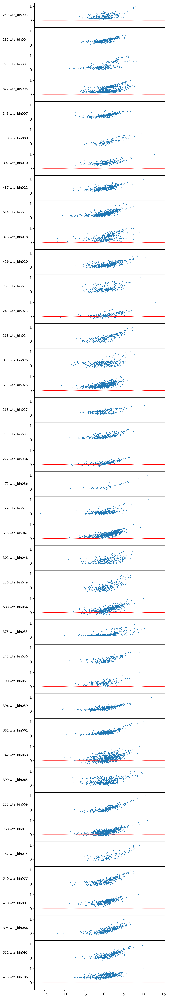

,#geneID,cog_cat,cazy,keggID,kegg_description,(y)distance_metric,(x)avgO-E/E%
0,wte_bin003|NODE_1_2,F,na,K01955,"carB, CPA2; carbamoyl-phosphate synthase large...",1.269048,8.670485
1,wte_bin003|NODE_1_9,F,na,K23753,"ppk2, pap; AMP-polyphosphate phosphotransferas...",0.437807,3.337266
2,wte_bin003|NODE_1_14,E,na,K02003,ABC.CD.A; putative ABC transport system ATP-bi...,0.988642,6.696699
3,wte_bin003|NODE_1_37,L,na,K03701,uvrA; excinuclease ABC subunit A,1.238965,8.728007
4,wte_bin003|NODE_1_39,L,na,K03702,uvrB; excinuclease ABC subunit B,1.038204,10.031035
...,...,...,...,...,...,...,...
6336,wte_bin106|NODE_12853_2,CE,na,K00052,"leuB, IMDH; 3-isopropylmalate dehydrogenase [E...",1.240596,2.082617
6337,wte_bin106|NODE_12853_3,E,na,K01704,"leuD, IPMI-S; 3-isopropylmalate/(R)-2-methylma...",1.542075,3.270773
6338,wte_bin106|NODE_12853_4,E,na,K01703,"leuC, IPMI-L; 3-isopropylmalate/(R)-2-methylma...",1.768818,4.828143
6339,wte_bin106|NODE_16784_1,C,na,K02111,"ATPF1A, atpA; F-type H+/Na+-transporting ATPas...",2.593560,13.760100


In [130]:
compare_gene_to_bin_coverages(wte, bin_list=hq_bins, file_name=sig_genes,
                              distance_metric='euclidean',
                              distance_base='expected',
                              scale_X='log2')

### Some other ways to plot the data using different measures of distance or similarity (Y axis) and different basis for comparison

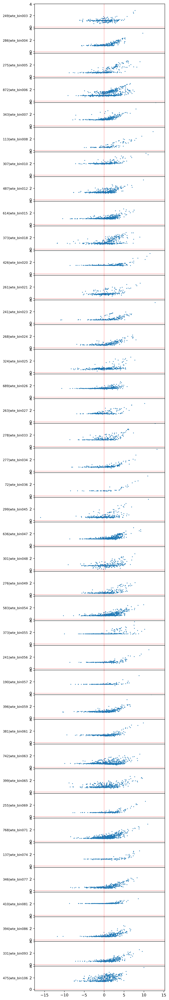

,geneID,cog_cat,cazy,keggID,kegg_description,cos_sim,O/E
0,wte_bin003|NODE_1_2,F,na,K01955,"carB, CPA2; carbamoyl-phosphate synthase large...",0.908261,8.670485
1,wte_bin003|NODE_1_9,F,na,K23753,"ppk2, pap; AMP-polyphosphate phosphotransferas...",1.183671,3.337266
2,wte_bin003|NODE_1_14,E,na,K02003,ABC.CD.A; putative ABC transport system ATP-bi...,0.997955,6.696699
3,wte_bin003|NODE_1_37,L,na,K03701,uvrA; excinuclease ABC subunit A,0.927619,8.728007
4,wte_bin003|NODE_1_39,L,na,K03702,uvrB; excinuclease ABC subunit B,1.084856,10.031035
...,...,...,...,...,...,...,...
6336,wte_bin106|NODE_12853_2,CE,na,K00052,"leuB, IMDH; 3-isopropylmalate dehydrogenase [E...",1.358679,2.082617
6337,wte_bin106|NODE_12853_3,E,na,K01704,"leuD, IPMI-S; 3-isopropylmalate/(R)-2-methylma...",1.498726,3.270773
6338,wte_bin106|NODE_12853_4,E,na,K01703,"leuC, IPMI-L; 3-isopropylmalate/(R)-2-methylma...",1.724130,4.828143
6339,wte_bin106|NODE_16784_1,C,na,K02111,"ATPF1A, atpA; F-type H+/Na+-transporting ATPas...",2.602218,13.760100


In [87]:
compare_gene_to_bin_coverages(wte, bin_list=hq_bins, file_name='',
                              distance_metric='euclidean',
                              distance_base='rpkm',
                              scale_X='log2')

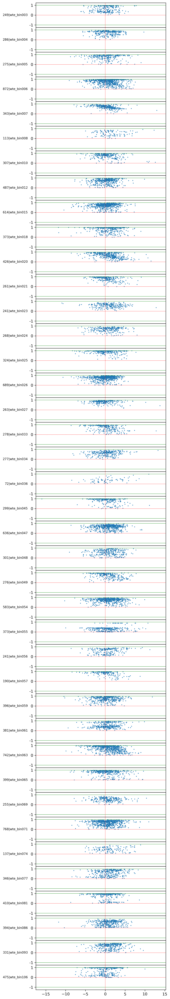

,geneID,cog_cat,cazy,keggID,kegg_description,cos_sim,O/E
0,wte_bin003|NODE_1_2,F,na,K01955,"carB, CPA2; carbamoyl-phosphate synthase large...",0.972706,8.670485
1,wte_bin003|NODE_1_9,F,na,K23753,"ppk2, pap; AMP-polyphosphate phosphotransferas...",0.235055,3.337266
2,wte_bin003|NODE_1_14,E,na,K02003,ABC.CD.A; putative ABC transport system ATP-bi...,0.881199,6.696699
3,wte_bin003|NODE_1_37,L,na,K03701,uvrA; excinuclease ABC subunit A,0.987296,8.728007
4,wte_bin003|NODE_1_39,L,na,K03702,uvrB; excinuclease ABC subunit B,0.833684,10.031035
...,...,...,...,...,...,...,...
6336,wte_bin106|NODE_12853_2,CE,na,K00052,"leuB, IMDH; 3-isopropylmalate dehydrogenase [E...",0.811679,2.082617
6337,wte_bin106|NODE_12853_3,E,na,K01704,"leuD, IPMI-S; 3-isopropylmalate/(R)-2-methylma...",0.281466,3.270773
6338,wte_bin106|NODE_12853_4,E,na,K01703,"leuC, IPMI-L; 3-isopropylmalate/(R)-2-methylma...",0.350921,4.828143
6339,wte_bin106|NODE_16784_1,C,na,K02111,"ATPF1A, atpA; F-type H+/Na+-transporting ATPas...",0.998472,13.760100


In [71]:
compare_gene_to_bin_coverages(wte, bin_list=hq_bins, file_name='',
                              distance_metric='cosine_similarity',
                              distance_base='expected',
                              scale_X='log2')

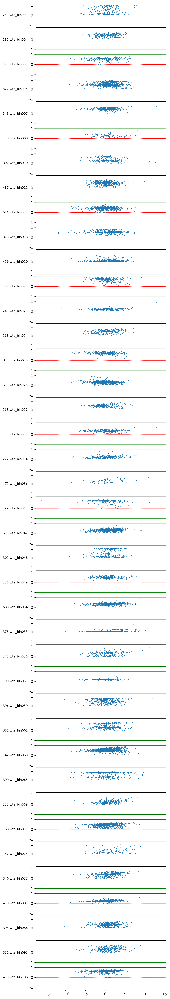

,geneID,cog_cat,cazy,keggID,kegg_description,cos_sim,O/E
0,wte_bin003|NODE_1_2,F,na,K01955,"carB, CPA2; carbamoyl-phosphate synthase large...",0.953056,8.670485
1,wte_bin003|NODE_1_9,F,na,K23753,"ppk2, pap; AMP-polyphosphate phosphotransferas...",0.059117,3.337266
2,wte_bin003|NODE_1_14,E,na,K02003,ABC.CD.A; putative ABC transport system ATP-bi...,0.759426,6.696699
3,wte_bin003|NODE_1_37,L,na,K03701,uvrA; excinuclease ABC subunit A,0.919379,8.728007
4,wte_bin003|NODE_1_39,L,na,K03702,uvrB; excinuclease ABC subunit B,0.642408,10.031035
...,...,...,...,...,...,...,...
6336,wte_bin106|NODE_12853_2,CE,na,K00052,"leuB, IMDH; 3-isopropylmalate dehydrogenase [E...",0.724664,2.082617
6337,wte_bin106|NODE_12853_3,E,na,K01704,"leuD, IPMI-S; 3-isopropylmalate/(R)-2-methylma...",0.482674,3.270773
6338,wte_bin106|NODE_12853_4,E,na,K01703,"leuC, IPMI-L; 3-isopropylmalate/(R)-2-methylma...",0.523398,4.828143
6339,wte_bin106|NODE_16784_1,C,na,K02111,"ATPF1A, atpA; F-type H+/Na+-transporting ATPas...",0.676105,13.760100


In [88]:
compare_gene_to_bin_coverages(wte, bin_list=hq_bins, file_name='',
                              distance_metric='cosine_similarity',
                              distance_base='rpkm',
                              scale_X='log2')

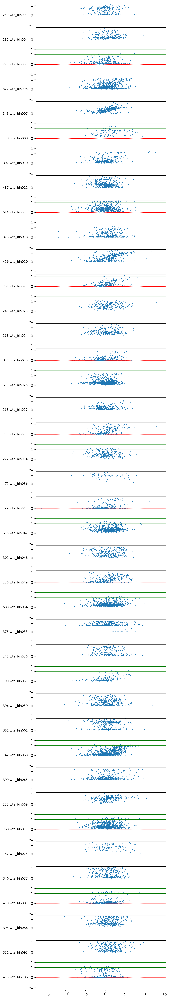

,geneID,cog_cat,cazy,keggID,kegg_description,cos_sim,O/E
0,wte_bin003|NODE_1_2,F,na,K01955,"carB, CPA2; carbamoyl-phosphate synthase large...",0.030950,8.670485
1,wte_bin003|NODE_1_9,F,na,K23753,"ppk2, pap; AMP-polyphosphate phosphotransferas...",0.939799,3.337266
2,wte_bin003|NODE_1_14,E,na,K02003,ABC.CD.A; putative ABC transport system ATP-bi...,0.139891,6.696699
3,wte_bin003|NODE_1_37,L,na,K03701,uvrA; excinuclease ABC subunit A,0.014950,8.728007
4,wte_bin003|NODE_1_39,L,na,K03702,uvrB; excinuclease ABC subunit B,0.194290,10.031035
...,...,...,...,...,...,...,...
6336,wte_bin106|NODE_12853_2,CE,na,K00052,"leuB, IMDH; 3-isopropylmalate dehydrogenase [E...",0.188606,2.082617
6337,wte_bin106|NODE_12853_3,E,na,K01704,"leuD, IPMI-S; 3-isopropylmalate/(R)-2-methylma...",0.851965,3.270773
6338,wte_bin106|NODE_12853_4,E,na,K01703,"leuC, IPMI-L; 3-isopropylmalate/(R)-2-methylma...",0.764235,4.828143
6339,wte_bin106|NODE_16784_1,C,na,K02111,"ATPF1A, atpA; F-type H+/Na+-transporting ATPas...",0.001656,13.760100


In [89]:
compare_gene_to_bin_coverages(wte, bin_list=hq_bins, file_name='',
                              distance_metric='correlation',
                              distance_base='expected',
                              scale_X='log2')

## Compare genes with significant coverage to functional guild (cluster) enriched genes
1. How many genes overlap between the sets?
2. What is the broad (COG category) functional distribution of high coverage (conserved) genes?
3. What proportion are unassigned?

Get:
BinID | #ORFS | #SIG_ORFS | #InCluster(ClusterSum) | #NA's | COG_dist_bar

In [37]:
sig_genes = './data/sig_genes_from_coverage.txt'

In [38]:
def load_sig_genes (self, gene_file):
    print("\t< > loading gene file: " + gene_file)
    self.sig_genes = {}
    with open(gene_file) as inF:
        for line in inF:
            if line[0] != '#':
                line_list = line.strip().split('\t')
                geneID = line_list[0]
                binID = geneID.split('|')[0]
                cog_cat = line_list[1]
                cazyme = line_list[2]
                keggID = line_list[3]
                #Y = float(line_list[4])
                #X = float(line_list[5])
                if binID not in self.sig_genes:
                    self.sig_genes[binID] = {'geneID':[geneID],'keggID':[keggID], 'cog_cat':[cog_cat]}
                else:
                    self.sig_genes[binID]['geneID'].append(geneID)
                    self.sig_genes[binID]['keggID'].append(keggID)
                    self.sig_genes[binID]['cog_cat'].append(cog_cat)
    inF.close()
    
def load_cluster_genes (self, cluster_names, cluster_files):
    #_KeggID	test_val	mean	std_dev	percentile	z	p_high	
    
    if type(cluster_names) != list:
        cluster_names = [cluster_names]
    if type(cluster_files) != list:
        cluster_files = [cluster_files]
    self.cluster_genes = {}
    for (cluster, c_file) in zip(cluster_names, cluster_files):
    
        print("\t< > loading cluster file: " + c_file)
   
        self.cluster_genes[cluster] = []
        with open(c_file) as inF:
            for line in inF:
                if line[0] != '#':
                    line_list = line.strip().split('\t')
                    keggID = line_list[0]
                    #test_val = float(line_list[1])
                    #mean = float(line_list[2])
                    #std_dev = float(line_list[3])
                    #percentile = float(line_list[4])
                    #z = float(line_list[5])
                    #p_high = float(line_list[6])
                    self.cluster_genes[cluster].append(keggID)
        inF.close()
    
def compare_cluster_sig_genes (self, cluster_names_list, cluster_lists_list,
                               bins_file_name='', ko_file_name=''):
    
    #_self.sig_genes[binID] = {'geneID':[geneID],'keggID':[keggID], 'cog_cat':[cog_cat]}
    #_self.cluster_genes[cluster_name].append(keggID)
    
    #_for each bin:
    #        how many sig genes in cluster
    #        how many sig genes w/o KO annotation
    #        distribution of sig genes by cog_category 
    #self.assembly_dict[binID]['genes'][geneID]['length_nt'] = gene_length
    #self.assembly_dict[binID]['genes'][geneID]['COG'] = []
    #self.assembly_dict[binID]['genes'][geneID]['kegg'] = 'na'
    #self.assembly_dict[binID]['genes'][geneID]['CAZy_category'] = 'na'
    #self.assembly_dict[binID]['genes'][geneID]['CAZyme'] = 'na'
    #self.assembly_dict[binID]['genes'][geneID]['mpileup']= []
    #
    overlap_KOs = {}
    sig_data = []
    bin_data = []
    bin_names = []
    df_columns = ['#BinID','Cluster_Name','Cluster_KOs','Sig_KOs', 'Overlap_KOs','KO_NAs','Bin_ORFS']
    
    for (cluster_name, cluster_list) in zip(cluster_names_list, cluster_lists_list):
        overlap_KOs[cluster_name] = []
        cluster_KOs = self.cluster_genes[cluster_name]
        cluster_KO_count = len(cluster_KOs)
        for binID in cluster_list:
            bin_data = []
            sig_KO = self.sig_genes[binID]['keggID']
            num_sig_KO = len(sig_KO)
            sig_COG = self.sig_genes[binID]['cog_cat']
            num_sig = len(self.sig_genes[binID]['geneID'])
            num_genes = len(self.assembly_dict[binID]['genes'])
            num_ko_nas = sig_KO.count('na')
            numKO_overlap = 0
            for ko in sig_KO:
                if ko in cluster_KOs:
                    numKO_overlap += 1
                    overlap_KOs[cluster_name].append(ko)
            bin_data = [binID, cluster_name, cluster_KO_count, num_sig_KO, numKO_overlap, num_ko_nas, num_genes]
            sig_data.append(bin_data)
    
    sig_data_df = pd.DataFrame(sig_data,columns=df_columns)
    if bins_file_name:
        sig_genes_df.to_csv(bins_file_name, sep="\t", index=False)
    display(sig_data_df)
    
    overlap_data = []
    for clusterID in overlap_KOs:
        for ko in overlap_KOs[clusterID]:
            description = self.keggDB_descriptions[ko]
            overlap_data.append([clusterID,ko,description])
    overlap_df = pd.DataFrame(overlap_data,columns=['clusterID','KeggID','KO descriptin'])
    if ko_file_name:
        overlap_df.to_csv(ko_file_name, sep="\t", index=False)
    display(overlap_df)     
    

In [39]:
cluster1_file = './data/cluster1.txt'
cluster2_file = './data/cluster2.txt'
cluster3_file = './data/cluster3.txt'
cluster4_file = './data/cluster4.txt'
cluster5_file = './data/cluster5.txt'
cluster6_file = './data/cluster6.txt'
cluster7_file = './data/cluster7.txt'
cluster8_file = './data/cluster8.txt'

In [40]:
cazy_list = ['AA','CBM','CE','GH','GT','PL']

In [41]:
cog_cats = ['C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','S','T','U','V']

In [42]:
load_sig_genes(wte, sig_genes)

	< > loading gene file: ./data/sig_genes_from_coverage.txt


In [43]:
cluster_names = ['cluster1','cluster2','cluster3','cluster4','cluster5','cluster6','cluster7','cluster8']

In [44]:
cluster_files = [cluster1_file, cluster2_file, cluster3_file, cluster4_file,
                 cluster5_file, cluster6_file, cluster7_file, cluster8_file]

In [45]:
# alpha-(1) 'wte_bin081'

# beta-(4) , & gamma-(1) proteobacteria
cluster1 = ['wte_bin012','wte_bin015','wte_bin026', 'wte_bin086','wte_bin106']

# methanogens
cluster2 = ['wte_bin003','wte_bin005','wte_bin018','wte_bin021','wte_bin025','wte_bin045',
            'wte_bin048','wte_bin055','wte_bin057']

# deltaproteobacteria
cluster3 = ['wte_bin059','wte_bin034','wte_bin006','wte_bin033']

# clostridia
cluster4 = ['wte_bin056','wte_bin069','wte_bin074']

# anaerolineae
cluster5 = ['wte_bin047','wte_bin049','wte_bin020','wte_bin023','wte_bin063']

# bacteroidia (3), phycisphaerae (1), and planctomycetia (1)
cluster6 = ['wte_bin010','wte_bin027', 'wte_bin065','wte_bin054','wte_bin071']

# flavobacteria, ignavibacteia(2), 
cluster7 = ['wte_bin061','wte_bin036','wte_bin093']

#FCPU426, OP8, krumholzibacteria, WOR-3, and Fermentibacteria
cluster8 = ['wte_bin004','wte_bin008','wte_bin024','wte_bin007','wte_bin077']


In [46]:
cluster_lists = [cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8]

In [47]:
load_cluster_genes(wte, cluster_names, cluster_files)

	< > loading cluster file: ./data/cluster1.txt
	< > loading cluster file: ./data/cluster2.txt
	< > loading cluster file: ./data/cluster3.txt
	< > loading cluster file: ./data/cluster4.txt
	< > loading cluster file: ./data/cluster5.txt
	< > loading cluster file: ./data/cluster6.txt
	< > loading cluster file: ./data/cluster7.txt
	< > loading cluster file: ./data/cluster8.txt


In [48]:
ko_file_name = './data/sig_ko_cluster_overlap.txt'

In [54]:
compare_cluster_sig_genes (wte, cluster_names, cluster_lists, ko_file_name='')

,#BinID,Cluster_Name,Cluster_KOs,Sig_KOs,Overlap_KOs,KO_NAs,Bin_ORFS
0,wte_bin012,cluster1,58,173,3,26,3298
1,wte_bin015,cluster1,58,213,5,22,3870
2,wte_bin026,cluster1,58,214,5,15,3532
3,wte_bin086,cluster1,58,183,4,44,2897
4,wte_bin106,cluster1,58,170,2,9,2953
5,wte_bin003,cluster2,151,91,11,15,2867
6,wte_bin005,cluster2,151,105,7,59,3351
7,wte_bin018,cluster2,151,186,25,102,2943
8,wte_bin021,cluster2,151,96,14,28,2658
9,wte_bin025,cluster2,151,125,19,49,2545


,clusterID,KeggID,KO descriptin
0,cluster1,K03781,"katE, CAT, catB, srpA; catalase [EC:1.11.1.6]"
1,cluster1,K00404,ccoN; cytochrome c oxidase cbb3-type subunit I...
2,cluster1,K06134,COQ7; 3-demethoxyubiquinol 3-hydroxylase [EC:1...
3,cluster1,K03599,"sspA, mglA; stringent starvation protein A"
4,cluster1,K00404,ccoN; cytochrome c oxidase cbb3-type subunit I...
...,...,...,...
241,cluster7,K01847,MUT; methylmalonyl-CoA mutase [EC:5.4.99.2]
242,cluster7,K07263,pqqL; zinc protease [EC:3.4.24.-]
243,cluster7,K01847,MUT; methylmalonyl-CoA mutase [EC:5.4.99.2]
244,cluster8,K07114,yfbK; Ca-activated chloride channel homolog
